In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

## Data Structure

# Loading the data
To get started let's first load in the data! We will make use of the helper functions provided in `data_utils.py`

In [ ]:
import sys
project_path = '/content/drive/MyDrive/Fall 2025/DATAC200: Principles & Techniques of Data Science'
sys.path.append(project_path)

In [ ]:
!unzip "/content/drive/MyDrive/Fall 2025/DATAC200: Principles & Techniques of Data Science/_shared.zip" -d /content/

Archive:  /content/drive/MyDrive/Fall 2025/DATAC200: Principles & Techniques of Data Science/_shared.zip
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/test_images_hurricane-matthew.npz  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/test_images_flooding-fire.npz  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/socal-fire/index.csv  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/socal-fire/train_images.npz  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/socal-fire/train_labels.npy  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/hurricane-matthew/index.csv  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/hurricane-matthew/train_images.npz  
  inflating: /content/_shared/bcourses-1547854-readonly/satellite-image-data/hurricane-matthew/train_labels.npy  
  inflating: /content/_s

In [ ]:
# should work as long as data_utils is in project_path directory
from data_utils import get_images, get_labels

In [ ]:
!ls /content

drive  sample_data  _shared


In [ ]:
data_dir_path = "/content/_shared/bcourses-1547854-readonly/satellite-image-data"

In [ ]:
import os

# Check the structure of the data directory
print("=== Exploring Data Directory Structure ===\n")

data_dir = data_dir_path  # or whatever your data_dir variable is
print(f"Base directory: {data_dir}\n")

# List contents of main data directory
print("Contents of main data directory:")
for item in os.listdir(data_dir):
    item_path = os.path.join(data_dir, item)
    if os.path.isdir(item_path):
        print(f"  📁 {item}/")
    else:
        print(f"  📄 {item}")

print("\n" + "="*50 + "\n")

# Explore each disaster subdirectory
for disaster in ['midwest-flooding', 'socal-fire', 'hurricane-matthew']:
    disaster_path = os.path.join(data_dir, disaster)
    if os.path.exists(disaster_path):
        print(f"Contents of {disaster}/:")
        for item in os.listdir(disaster_path):
            item_path = os.path.join(disaster_path, item)
            if os.path.isfile(item_path):
                # Show file size too
                size = os.path.getsize(item_path)
                size_mb = size / (1024 * 1024)
                print(f"  📄 {item} ({size_mb:.2f} MB)")
            else:
                print(f"  📁 {item}/")
        print()

=== Exploring Data Directory Structure ===

Base directory: /content/_shared/bcourses-1547854-readonly/satellite-image-data

Contents of main data directory:
  📄 test_images_hurricane-matthew.npz
  📄 test_images_flooding-fire.npz
  📁 socal-fire/
  📁 hurricane-matthew/
  📁 midwest-flooding/


Contents of midwest-flooding/:
  📄 train_labels.npy (0.00 MB)
  📄 train_images.npz (394.03 MB)
  📄 index.csv (0.02 MB)

Contents of socal-fire/:
  📄 train_labels.npy (0.00 MB)
  📄 train_images.npz (379.59 MB)
  📄 index.csv (0.02 MB)

Contents of hurricane-matthew/:
  📄 train_labels.npy (0.00 MB)
  📄 train_images.npz (425.01 MB)
  📄 index.csv (0.02 MB)



The following is the list of disasters in our dataset.

In [ ]:
disaster_list = ["hurricane-matthew", "socal-fire", "midwest-flooding"]

We will load each disaster train dataset into a dictionary. Recall that each disaster consists of images and labels (0 - 3) of the damage level.

In [ ]:
data = {}
split = "train"
data_dir = data_dir_path

for disaster in disaster_list:
    print(f"Loading {split} images and labels for {disaster} dataset...")
    images = get_images(data_dir, disaster, split=split)
    labels = get_labels(data_dir, disaster, split=split)
    data[disaster] = {"images": images, "labels": labels}

Loading train images and labels for hurricane-matthew dataset...
Loading train images and labels for socal-fire dataset...
Loading train images and labels for midwest-flooding dataset...


Let's visualize an image and its label in the dataset.

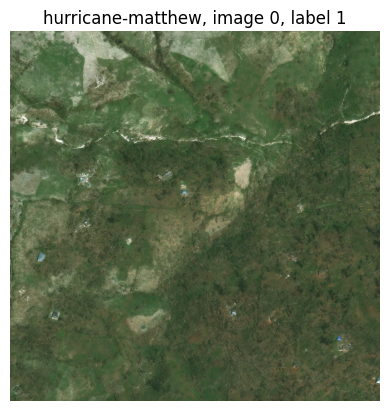

image shape: (1024, 1024, 3)


In [ ]:
disaster = disaster_list[0]
images = data[disaster]["images"]
labels = data[disaster]["labels"]

# index of the image to display
idx = 0
img = images[idx]
label = labels[idx]

plt.title(f"{disaster}, image {idx}, label {label}")
plt.imshow(img.astype(np.uint8))
plt.axis("off")
plt.show()

#
print(f"image shape: {img.shape}")

# Extracting Color Information
Each image is an RGB image represented as a numpy array of dimensions (width, height, 3). The last dimension corresponds to the RGB *color channels* in the image. We can split the image by color channels and visualize each of them individually.

NameError: name 'img' is not defined

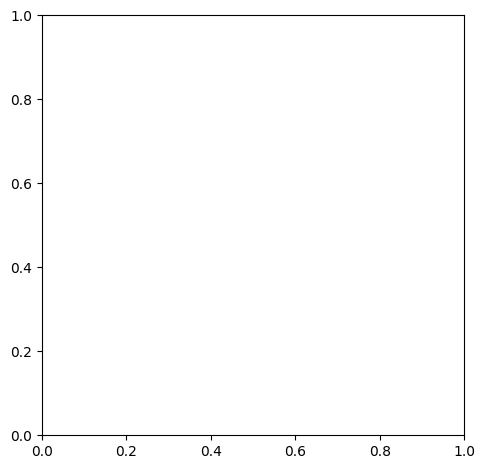

In [ ]:
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(img[:, :, 0], cmap="Reds", vmin=0, vmax=255)
plt.title("Red Channel")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(img[:, :, 1], cmap="Greens", vmin=0, vmax=255)
plt.title("Green Channel")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(img[:, :, 2], cmap="Blues", vmin=0, vmax=255)
plt.title("Blue Channel")
plt.axis("off")

plt.show()

We can zoom in on just a pixel as well.

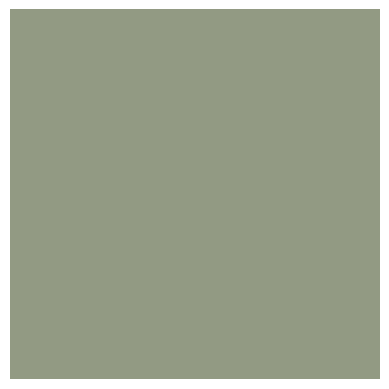

Pixel value: [146 154 131], coordinate: (15, 35)


In [ ]:
coord = (15, 35)
pixel_value = img[coord[0], coord[1], :]
pixel_image = np.array([[pixel_value]])

plt.imshow(pixel_image)
plt.axis("off")
plt.show()

print(f"Pixel value: {pixel_value}, coordinate: {coord}")

# Extracting Edge and Texture Information

So far we have considered the **color** information in an image. However, other important aspects of an image are the edges and texture.

Let us consider some popular feature processing methods for extracting edge and texture information. We will use the utilities provided in `feature_utils.py`.

In [ ]:
from feature_utils import get_sobel_features, get_gabor_features, generate_gabor_kernel, get_local_binary_pattern

ModuleNotFoundError: No module named 'feature_utils'

Let's try the Sobel Edge Filter.

Read more about Sobel edge detection: https://en.wikipedia.org/wiki/Sobel_operator and https://scikit-image.org/docs/stable/auto_examples/edges/plot_edge_filter.html

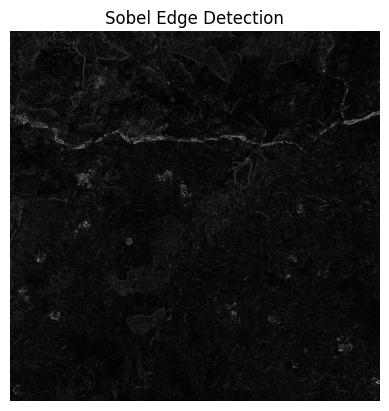

In [ ]:
edges = get_sobel_features(img)
plt.imshow(edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")
plt.show()

Now let's look at local binary patterns.

Read more about LBP: https://en.wikipedia.org/wiki/Local_binary_patterns and https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_local_binary_pattern.html

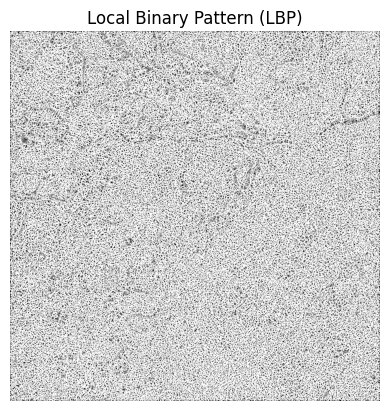

In [ ]:
lbp = get_local_binary_pattern(img, radius=3)
plt.imshow(lbp, cmap="gray")
plt.axis("off")
plt.title("Local Binary Pattern (LBP)")
plt.show()

Another popular filter for image processing is the Gabor filter. The Gabor filters are a family of filters parametrized by orientation, frequency, bandwith, etc. Let's generate one such filter.

Read more about Gabor filters: https://en.wikipedia.org/wiki/Gabor_filter and https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_gabor.html

In [ ]:
theta = 0
sigma = 1.0
frequency = 0.1

kernel = generate_gabor_kernel(theta, sigma, frequency)
gabor = get_gabor_features(img, kernel)

Let's visualize this filter (aka kernel) and the response of the image when we apply the filter. Concretely we are taking the convolution of the image with the filter. See https://en.wikipedia.org/wiki/Kernel_(image_processing) for more details.

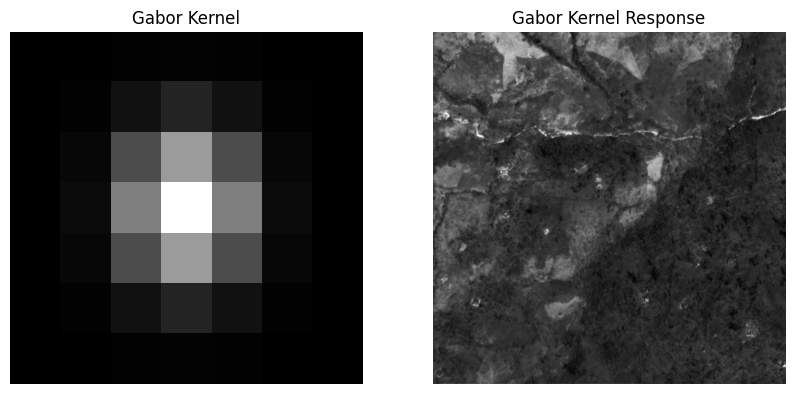

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

# Plot Gabor Kernel
axs[0].imshow(kernel, cmap="gray")
axs[0].axis("off")  # Remove axis
axs[0].set_title("Gabor Kernel")

# Plot Gabor Kernel Response
axs[1].imshow(gabor, cmap="gray")
axs[1].axis("off")  # Remove axis
axs[1].set_title("Gabor Kernel Response")

plt.show()

# Exploratory Data Analysis

The agency would like you to start performing some exploratory data analysis to build an initial understanding of the data. As part of the exploratory data analysis, the agency is interested in understanding certain aspects of the dataset better.

Feel free to add more cells as you see fit for your analysis.

# EDA

## Number of Images per Disaster Type


In [ ]:
disaster = disaster_list[0]
images_0 = data[disaster]["images"]
print("Number of disasters for Hurricane Matthew: ", len(images_0), "\n")

disaster = disaster_list[1]
images_1 = data[disaster]["images"]
len(images_1)
print("Number of disasters for SoCal Fires: ", len(images_1), "\n")

disaster = disaster_list[2]
images_2 = data[disaster]["images"]
len(images_2)
print("Number of disasters for Midwest Flooding: ", len(images_2), "\n")

Number of disasters for Hurricane Matthew:  200 

Number of disasters for SoCal Fires:  200 

Number of disasters for Midwest Flooding:  200 



## Distribution of Image Sizes in Each Dataset

In [ ]:
# dictionary with disasters as keys and value is a list of tuples where every tuple is the shape of the image
image_sizes = {}
# loops through all the disasters
for disaster in disaster_list:
    # accesses the images for a particular disaster
    images = data[disaster]["images"]
    # sizes is a list of tuples; every image in the images of this disaster gets a tuple
    # each tuple is height and width in pixels
    sizes = [(image.shape[0], image.shape[1]) for image in images]
    # the key that represents the current disaster gets sizes as its value
    image_sizes[disaster] = sizes

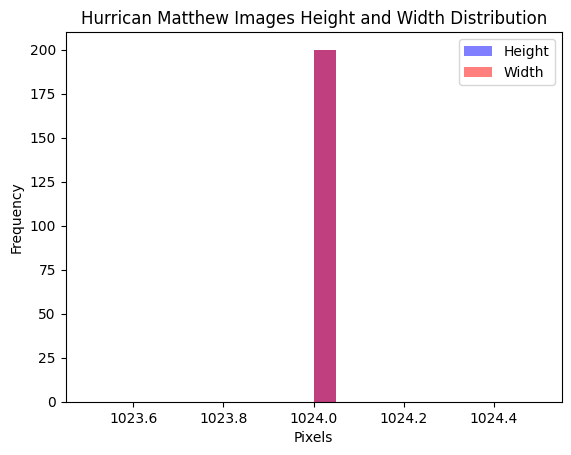

In [ ]:
# Plot 1 Hurricane Matthew
heights_0 = [size[0] for size in image_sizes[disaster_list[0]]]
widths_0 = [size[1] for size in image_sizes[disaster_list[0]]]
# density = False for raw counts
# alpha = 0.5 for some transparency because we knew the bars would overlap
plt.hist(heights_0, bins=20, density=False, alpha=0.5, color="blue", label="Height")
plt.hist(widths_0, bins=20, density=False, alpha=0.5, color="red", label="Width")
plt.xlabel("Pixels")
plt.ylabel("Frequency")
plt.title("Hurrican Matthew Images Height and Width Distribution")
plt.legend()
plt.show()

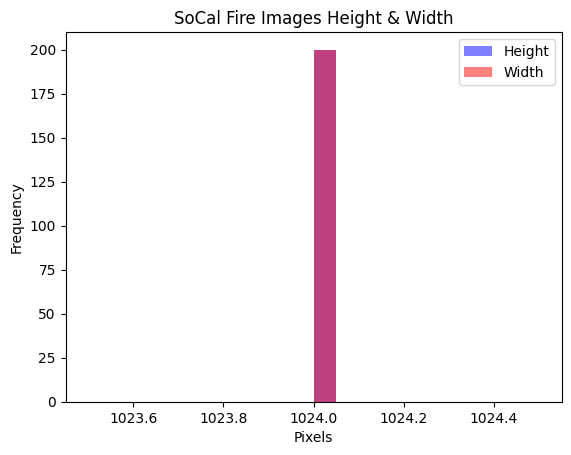

In [ ]:
# Plot 2: SoCal Fire
heights_1 = [s[0] for s in image_sizes[disaster_list[1]]]
widths_1 = [s[1] for s in image_sizes[disaster_list[1]]]

plt.hist(heights_1, bins=20, density=False, alpha=0.5, color="blue", label="Height")
plt.hist(widths_1, bins=20, density=False, alpha=0.5, color="red", label="Width")
plt.xlabel("Pixels")
plt.ylabel("Frequency")
plt.title("SoCal Fire Images Height & Width")
plt.legend()
plt.show()

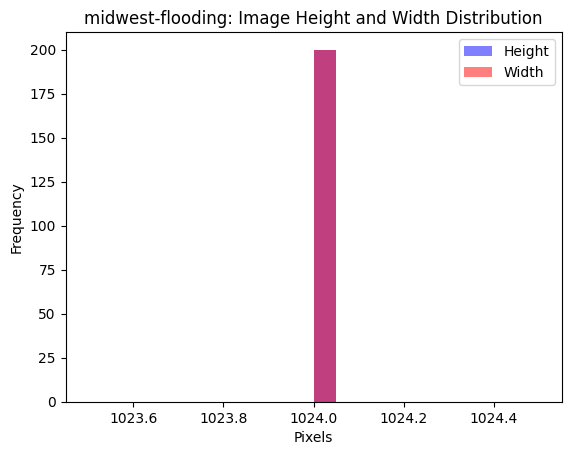

In [ ]:
# Plot 3: Midwest Flooding
heights_2 = [s[0] for s in image_sizes[disaster_list[2]]]
widths_2 = [s[1] for s in image_sizes[disaster_list[2]]]

plt.hist(heights_2, bins=20, density=False, alpha=0.5, color="blue", label="Height")
plt.hist(widths_2, bins=20, density=False, alpha=0.5, color="red", label="Width")
plt.xlabel("Pixels")
plt.ylabel("Frequency")
plt.title(f"{disaster_list[2]}: Image Height and Width Distribution")
plt.legend()
plt.show()

In [ ]:
print("Image Size Summary")
for disaster in disaster_list:
    sizes = image_sizes[disaster]
    heights = [s[0] for s in sizes]
    widths = [s[1] for s in sizes]

    print(f"\n{disaster}:")
    print(f" Height - Mean: {np.mean(heights):.2f}")
    print(f" Width - Mean: {np.mean(heights):.2f}")

Image Size Summary

hurricane-matthew:
 Height - Mean: 1024.00
 Width - Mean: 1024.00

socal-fire:
 Height - Mean: 1024.00
 Width - Mean: 1024.00

midwest-flooding:
 Height - Mean: 1024.00
 Width - Mean: 1024.00


## Distribution of Damage Labels

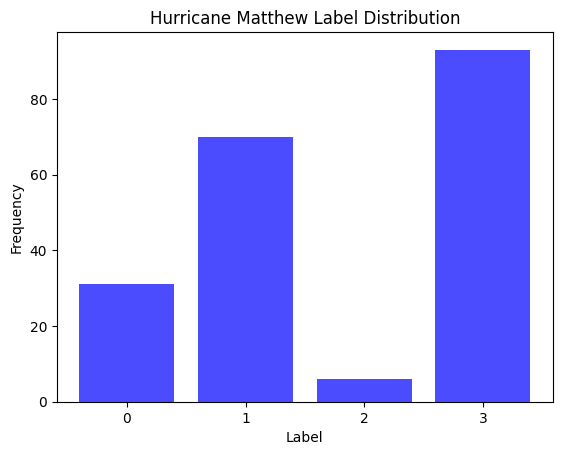

In [ ]:
# collecting label distributions for each disaster
label_counts = {}
for disaster in disaster_list:
    labels = data[disaster]["labels"]
    label_counts[disaster] = labels

# Plot 1: Hurricane Matthew
labels_0 = label_counts[disaster_list[0]]
# finds all unique values in labels_0 an returns the counts of each unique value
unique_labels_0, counts_0 = np.unique(labels_0, return_counts = True)

plt.bar(unique_labels_0, counts_0, alpha=0.7, color="blue")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.title("Hurricane Matthew Label Distribution")
# sets the x axis ticks to be the unique labels
plt.xticks(unique_labels_0)
plt.show()

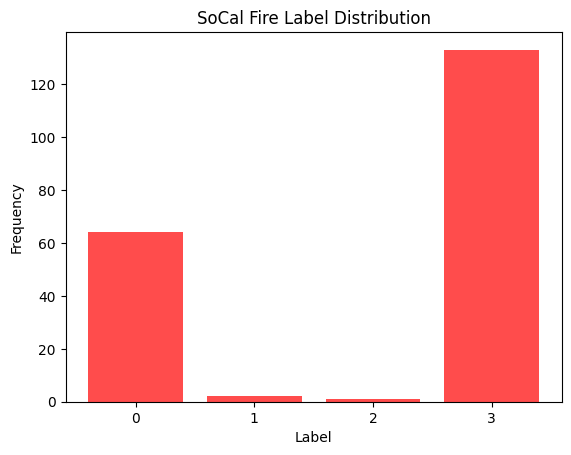

In [ ]:
# Plot 2: SoCal Fire
labels_1 = label_counts[disaster_list[1]]
unique_labels_1, counts_1 = np.unique(labels_1, return_counts=True)

plt.bar(unique_labels_1, counts_1, alpha=0.7, color="red")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.title("SoCal Fire Label Distribution")
plt.xticks(unique_labels_1)
plt.show()

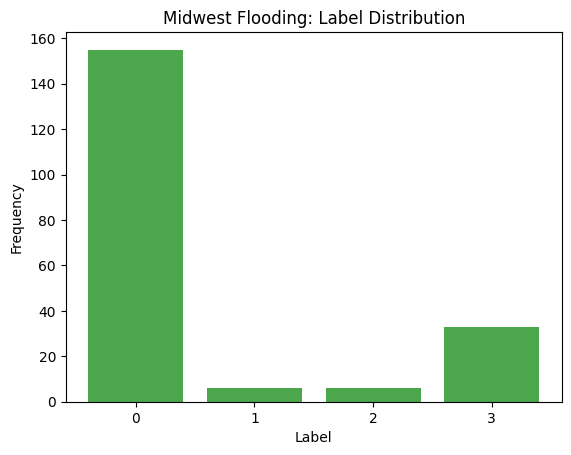

In [ ]:
# Plot 3: Midwest Flooding
labels_2 = label_counts[disaster_list[2]]
unique_labels_2, counts_2 = np.unique(labels_2, return_counts=True)

plt.bar(unique_labels_2, counts_2, alpha=0.7, color="green")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.title("Midwest Flooding: Label Distribution")
plt.xticks(unique_labels_2)
plt.show()

In [ ]:
# Summary Statistics

print("Label Distribution Summary")

for disaster in disaster_list:
    labels = label_counts[disaster]
    unique_labels, counts = np.unique(labels, return_counts=True)

    print(f"\n{disaster}: ")
    for label, count in zip(unique_labels, counts):
        percentage = (count / len(labels)) * 100
        print(f" Label {label}: {count} images ({percentage:.2f}%)")
    print(f" Total images: {len(labels)}")

Label Distribution Summary

hurricane-matthew: 
 Label 0: 31 images (15.50%)
 Label 1: 70 images (35.00%)
 Label 2: 6 images (3.00%)
 Label 3: 93 images (46.50%)
 Total images: 200

socal-fire: 
 Label 0: 64 images (32.00%)
 Label 1: 2 images (1.00%)
 Label 2: 1 images (0.50%)
 Label 3: 133 images (66.50%)
 Total images: 200

midwest-flooding: 
 Label 0: 155 images (77.50%)
 Label 1: 6 images (3.00%)
 Label 2: 6 images (3.00%)
 Label 3: 33 images (16.50%)
 Total images: 200


## Distribution of Color (RGB)

In [ ]:
# dictionary to store RGB mean values for each disaster
color_means = {}

# iterate through each disaster in the disaster list
for disaster in disaster_list:
    red_means = []
    green_means = []
    blue_means = []

    # iterate through each image in the disaster to calculate the mean
    # and store RGB values in arrays
    for img in data[disaster]['images']:
        red_means.append(img[:,:,0].mean())
        green_means.append(img[:,:,1].mean())
        blue_means.append(img[:,:,2].mean())

    # store the RGB means for each disaster in the dictionary
    color_means[disaster] = {
        'R': red_means,
        'G': green_means,
        'B': blue_means
    }

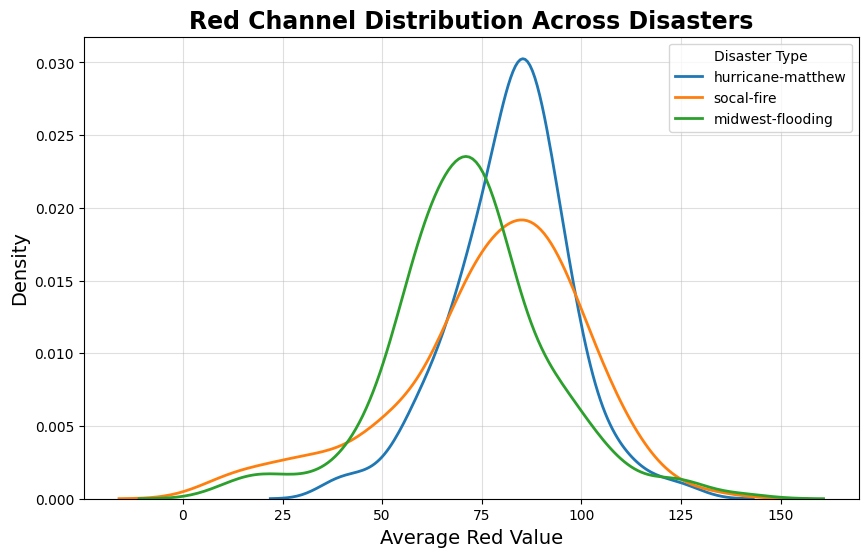

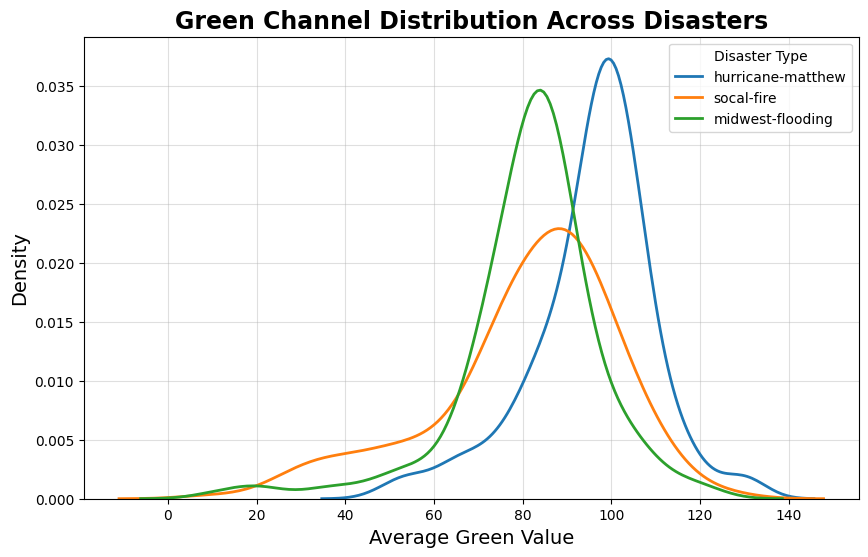

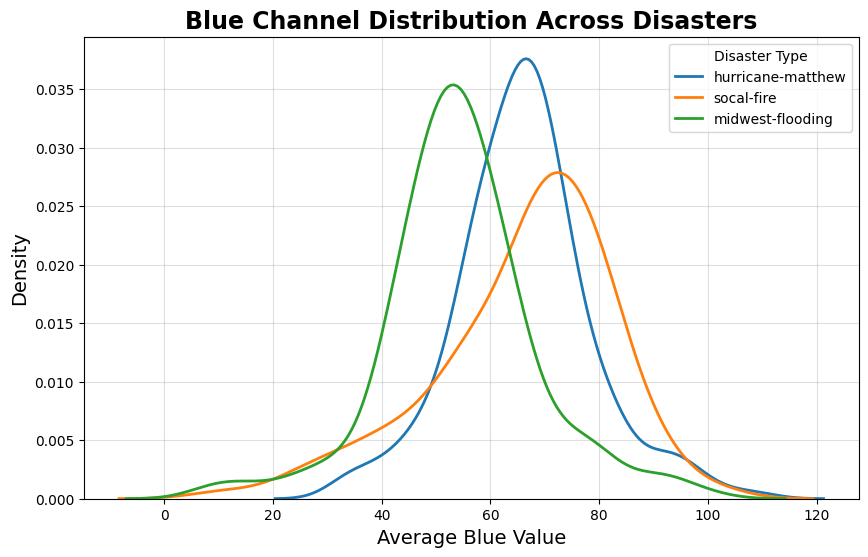

In [ ]:
# define color channels and their corresponding names
colors = ['R', 'G', 'B']
color_names = ['Red', 'Green', 'Blue']

# iterate through each color channel to create separate KDE plots
for color, color_name in zip(colors, color_names):
    plt.figure(figsize=(10, 6))

    # iterate through each disaster to plot its color distribution
    for disaster in disaster_list:
        sns.kdeplot(data=color_means[disaster][color], label=disaster, linewidth=2)

    # draw KDE plot to visualize the distribution of color values
    plt.title(color_name + " Channel Distribution Across Disasters", fontsize=17, fontweight='bold')
    plt.xlabel("Average " + color_name + " Value", fontsize=14)
    plt.ylabel('Density', fontsize=14)
    plt.legend(title='Disaster Type')
    plt.grid(True, alpha=0.4)
    plt.show()

## How are the distributions "separable"?

The below are a non-exhaustive list of ways we can think about classifying these disaster images. You do not have to include all of them in your analysis.

### 1. `midwest-flooding` vs `socal-fire`

Among the different disaster events, are there are distinctions in:

- image height, width, or overall size?
- RGB values?
- Sobel edges?
- Local Binary Patterns?
- Gabor kernels?



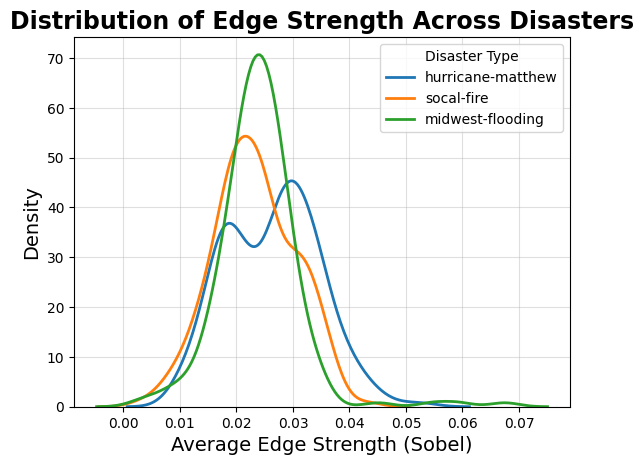

In [ ]:
# import Sobel function from feature_utils file
from feature_utils import get_sobel_features

# create dictionary to sstore Sobel edge features for each disaster
edge_strengths = {}

# iterate through each disaster in the disaster list
for disaster in disaster_list:
    strengths = []
    # Iterate through each image in the disaster to calculate the mean
    for img in data[disaster]['images']:
        edges = get_sobel_features(img)
        strengths.append(edges.mean())
    edge_strengths[disaster] = strengths

# iterate through disaster_list to draw KDE plot and visualize the distribution of edge strengths
for disaster in disaster_list:
    sns.kdeplot(data=edge_strengths[disaster], label=disaster, linewidth=2)

plt.title('Distribution of Edge Strength Across Disasters', fontsize=17, fontweight='bold')
plt.xlabel('Average Edge Strength (Sobel)', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend(title='Disaster Type')
plt.grid(True, alpha=0.4)
plt.show()

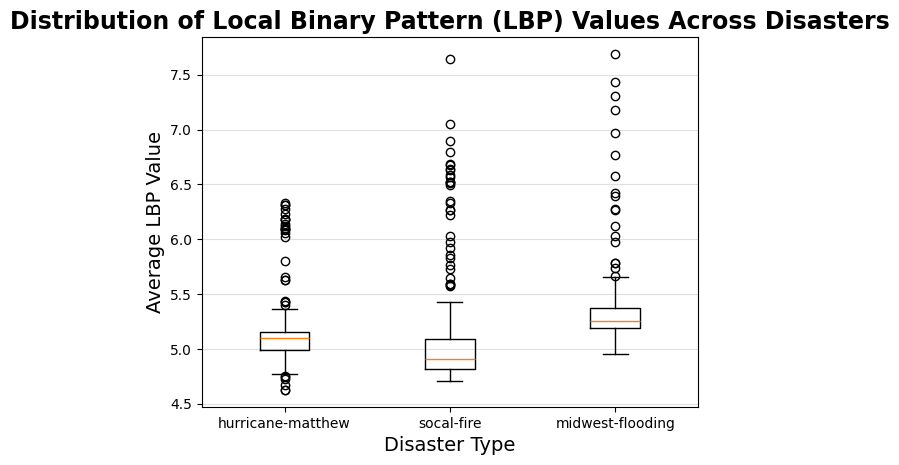

In [ ]:
# import Local Binary Pattern function from feature_utils file
from feature_utils import get_local_binary_pattern

# create dictionary to store lbp features for each disaster
lbp_strengths = {}

# iterate through each disaster in the disaster list
for disaster in disaster_list:
    strengths = []

    # Iterate through each image in the disaster to calculate the mean
    for img in data[disaster]['images']:
        lbp = get_local_binary_pattern(img)
        strengths.append(lbp.mean()) # store lbp value of each image and store in array
    lbp_strengths[disaster] = strengths

# prepare data for box plot by storing lbp values in array
lbp_data = []
for disaster in disaster_list:
    lbp_data.append(lbp_strengths[disaster])

# Create box plot to visualize distribution of lbp values
plt.boxplot(lbp_data, tick_labels=disaster_list)
plt.title('Distribution of Local Binary Pattern (LBP) Values Across Disasters', fontsize=17, fontweight='bold')
plt.xlabel('Disaster Type', fontsize=14)
plt.ylabel('Average LBP Value', fontsize=14)
plt.grid(True, alpha=0.4, axis='y')
plt.show()

### 2. Damage levels 1 vs 3 within the `hurricane-matthew` dataset

Is there a relationship between the damage level and:

- image height, width, or overall size?
- RGB values?
- Sobel edges?
- Local Binary Patterns?
- Gabor kernels?

In [ ]:
# get hurricane-matthew images and labels from the data dictionary
hurricane_images = data['hurricane-matthew']['images']
hurricane_labels = data['hurricane-matthew']['labels']

# lists to filter for damage levels 1 and 3 only
damage_1_images = []
damage_3_images = []

# iterate through each image and filter by damage level
for i in range(len(hurricane_images)):
    if hurricane_labels[i] == 1:
        damage_1_images.append(hurricane_images[i]) # Store damage level 1 images in damage_1_images array
    elif hurricane_labels[i] == 3:
        damage_3_images.append(hurricane_images[i]) # Store damage level 3 images in damage_3_images array

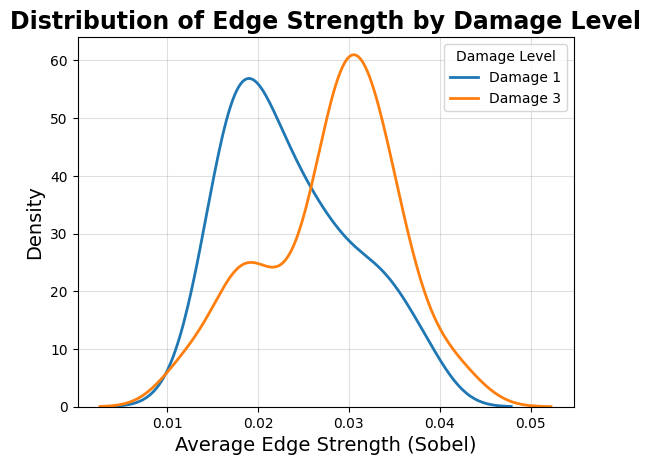

In [ ]:
# import sobel function from feature_utils file
from feature_utils import get_sobel_features

# calculate edge strength for each damage level
damage_1_edges = []
damage_3_edges = []

# iterate through each image in damage level 1 and 3 to calculate mean
# edge strenght of each iamge and store in array

for img in damage_1_images:
    edges = get_sobel_features(img)
    damage_1_edges.append(edges.mean())

for img in damage_3_images:
    edges = get_sobel_features(img)
    damage_3_edges.append(edges.mean())

# draw kdeplot to visualize the distribution of edge strengths
sns.kdeplot(data=damage_1_edges, label='Damage 1', linewidth=2)
sns.kdeplot(data=damage_3_edges, label='Damage 3', linewidth=2)
plt.title('Distribution of Edge Strength by Damage Level', fontsize=17, fontweight='bold')
plt.xlabel('Average Edge Strength (Sobel)', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend(title='Damage Level')
plt.grid(True, alpha=0.4)
plt.show()

## Visual Examples

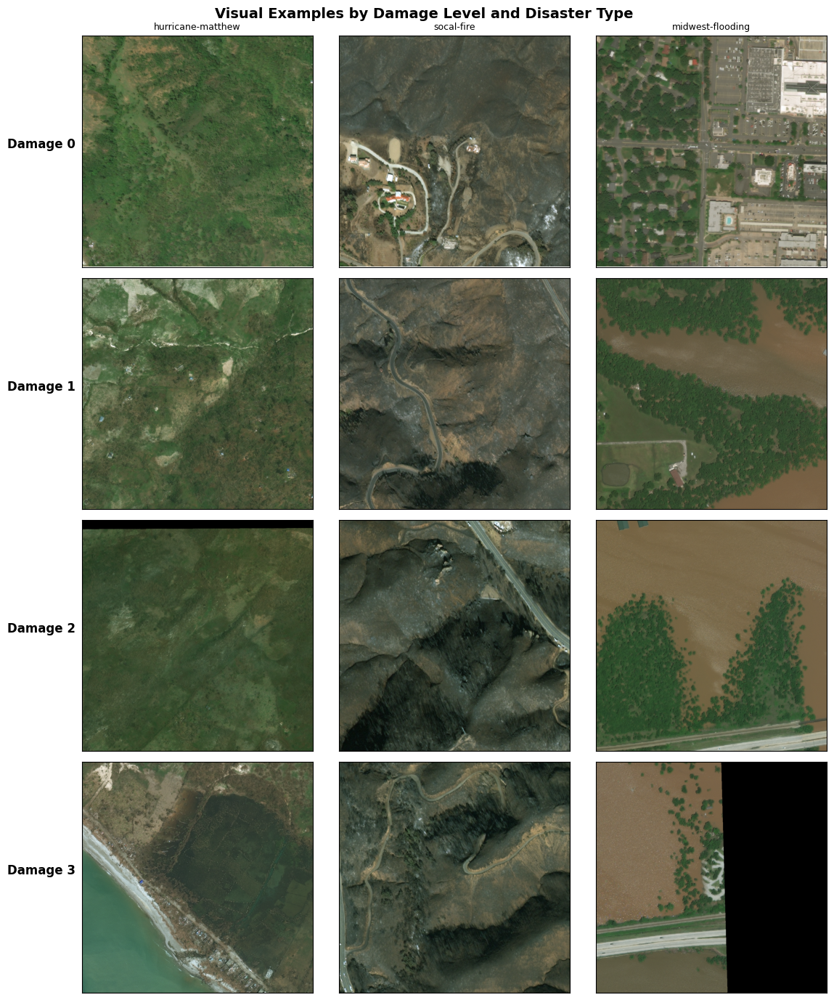

In [ ]:
# Create a 4x3 grid to show visual examples of each damage level and disaster type
fig, axes = plt.subplots(4, 3, figsize=(12, 14))

# Loop through rows (damage levels)
for row_num in range(4):

# Loop through columns (disasters)
    for col_num in range(3):
        disaster = ['hurricane-matthew', 'socal-fire', 'midwest-flooding'][col_num]

        # Get data for this disaster
        disaster_labels = data[disaster]["labels"]
        disaster_images = data[disaster]["images"]
        # Find images with this specific damage level
        matching_indices = np.where(disaster_labels == row_num)[0]
        # Show matching image image at position [row_num, col_num]
        axes[row_num, col_num].imshow(disaster_images[matching_indices[0]])

        # Turn off axes for all plots to make it cleaner
        axes[row_num, col_num].set_xticks([])
        axes[row_num, col_num].set_yticks([])

        # Add disaster name as title for top row
        if row_num == 0:
            axes[row_num, col_num].set_title(disaster, fontsize=9)

        # Add ylabel only to first column to show damage type
        if col_num == 0:
            axes[row_num, col_num].set_ylabel(f'Damage {row_num}', fontsize=12, fontweight='bold', rotation=0, labelpad=40)

plt.suptitle('Visual Examples by Damage Level and Disaster Type', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Heatmap with img count by disaster and damage level

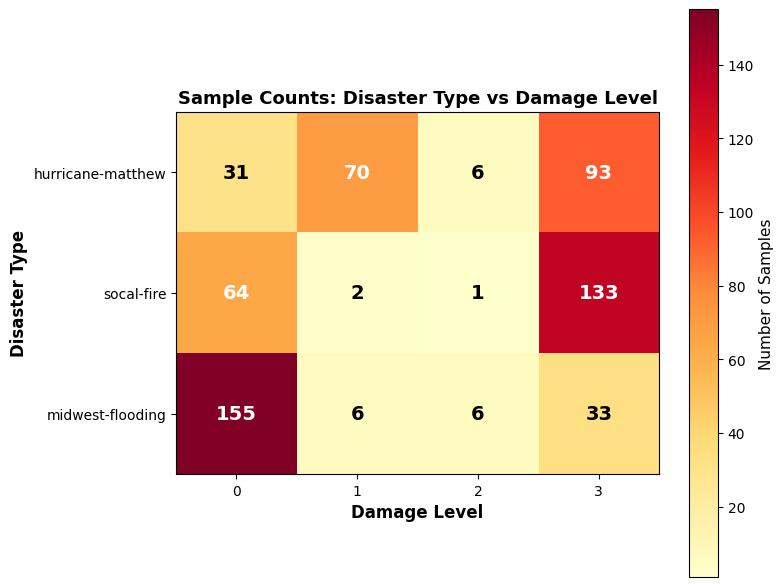

In [ ]:
# Heatmap showing counts
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

disasters = ['hurricane-matthew', 'socal-fire', 'midwest-flooding']
damage_levels = [0, 1, 2, 3]

# Build matrix of counts (each row represents a disasaster type, and each column a damage level)
count_matrix = []
for disaster in disasters:
    disaster_labels = data[disaster]["labels"]
    row = []
    # count how many images have each damage level for this disaster
    for damage_level in damage_levels:
        count = np.sum(disaster_labels == damage_level)
        row.append(count)
    count_matrix.append(row)

# Create heatmap (convert number to colors)
im = ax.imshow(count_matrix, cmap='YlOrRd')

# Add text annotations (put count number on each cell of the heatmap)
for disaster_num in range(len(disasters)):
    for damage_num in range(len(damage_levels)):
        count = count_matrix[disaster_num][damage_num]

        # use white text for dark cells, and black for lighter cells
        if count > 50:
            text_color = 'white'
        else:
            text_color = 'black'

        # add text to cell
        ax.text(damage_num, disaster_num, str(count),
                ha='center', va='center', color=text_color,
                fontsize=14, fontweight='bold')


# et tick positions and labels for x-axis (damage levels) and y-axis (disasters)
ax.set_xticks(np.arange(len(damage_levels)))
ax.set_yticks(np.arange(len(disasters)))
ax.set_xticklabels(damage_levels)
ax.set_yticklabels(disasters)
ax.set_xlabel('Damage Level', fontsize=12, fontweight='bold')
ax.set_ylabel('Disaster Type', fontsize=12, fontweight='bold')
ax.set_title('Sample Counts: Disaster Type vs Damage Level', fontsize=13, fontweight='bold')

# Add colorbar to show what color represents each number of samples
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Number of Samples', fontsize=11)

plt.tight_layout()
plt.show()

## Features Analysis

### Edge strength

Extract edge strength for all images from all disasters


In [ ]:
edge_data = []
disasters = ['hurricane-matthew', 'socal-fire', 'midwest-flooding']

for disaster in disasters:
    disaster_images = data[disaster]['images']
    disaster_labels = data[disaster]['labels']

    for img_num in range(len(disaster_images)):
        img = disaster_images[img_num]
        label = disaster_labels[img_num]

        # Calculate edge strength
        edges = get_sobel_features(img)
        edge_strength = edges.mean()

        edge_data.append({
            'disaster': disaster,
            'damage_level': label,
            'edge_strength': edge_strength
        })

# Convert to DataFrame
df_edges = pd.DataFrame(edge_data)

Visualize distribution by disaster and damage level

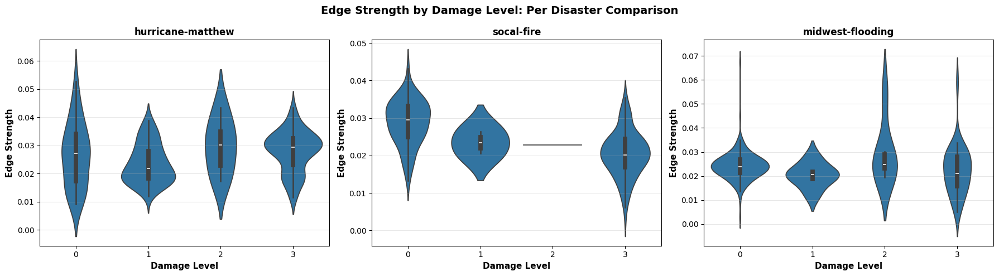

In [ ]:
# Violin plot to see if edge strength pattern holds for each disaster
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

disasters = ['hurricane-matthew', 'socal-fire', 'midwest-flooding']

for col_num, disaster in enumerate(disasters):
    disaster_data = df_edges[df_edges['disaster'] == disaster]

    sns.violinplot(data=disaster_data, x='damage_level', y='edge_strength', ax=axes[col_num])
    axes[col_num].set_xlabel('Damage Level', fontsize=11, fontweight='bold')
    axes[col_num].set_ylabel('Edge Strength', fontsize=11, fontweight='bold')
    axes[col_num].set_title(f'{disaster}', fontsize=12, fontweight='bold')
    axes[col_num].grid(True, axis='y', alpha=0.3)

plt.suptitle('Edge Strength by Damage Level: Per Disaster Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


### Gabor texture

Extract feature for all images

In [ ]:
# Gabor parameters
theta = 0  # Horizontal orientation
sigma = 3  # Bandwidth
frequency = 0.1  # Frequency

gabor_data = []

for disaster in disasters:
    disaster_images = data[disaster]['images']
    disaster_labels = data[disaster]['labels']

    for img_num in range(len(disaster_images)):
        img = disaster_images[img_num]
        label = disaster_labels[img_num]

        # Generate kernel and extract Gabor features
        kernel = generate_gabor_kernel(theta=theta, sigma=sigma, frequency=frequency)
        gabor = get_gabor_features(img, kernel)

        gabor_data.append({
            'disaster': disaster,
            'damage_level': label,
            'texture': gabor.mean()
        })

df_gabor = pd.DataFrame(gabor_data)
print(f"\nExtracted Gabor texture from {len(df_gabor)} images")


Extracted Gabor texture from 600 images


Visualize distribution by disaster and damage level

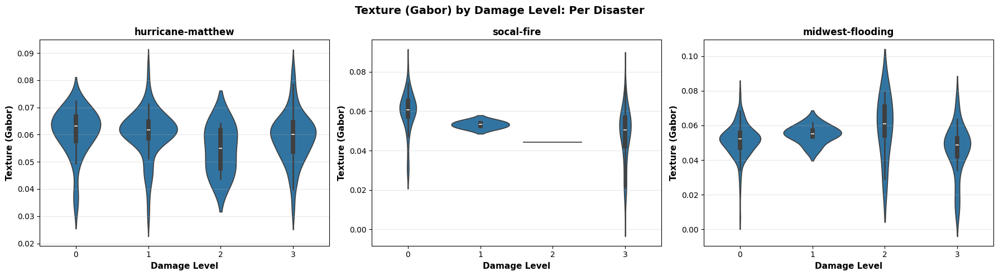

In [ ]:
# Compare texture across damage levels for each disaster
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for col_num, disaster in enumerate(disasters):
    disaster_data = df_gabor[df_gabor['disaster'] == disaster]

    sns.violinplot(data=disaster_data, x='damage_level', y='texture', ax=axes[col_num])
    axes[col_num].set_xlabel('Damage Level', fontsize=11, fontweight='bold')
    axes[col_num].set_ylabel('Texture (Gabor)', fontsize=11, fontweight='bold')
    axes[col_num].set_title(f'{disaster}', fontsize=12, fontweight='bold')
    axes[col_num].grid(True, axis='y', alpha=0.3)

plt.suptitle('Texture (Gabor) by Damage Level: Per Disaster',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Local Binary Pattern

Extract features for all images

In [ ]:
lbp_data = []

for disaster in disasters:
    disaster_images = data[disaster]['images']
    disaster_labels = data[disaster]['labels']

    for img_num in range(len(disaster_images)):
        img = disaster_images[img_num]
        label = disaster_labels[img_num]

        # Get LBP
        lbp = get_local_binary_pattern(img, radius=1, method='uniform')

        lbp_data.append({
            'disaster': disaster,
            'damage_level': label,
            'pattern': lbp.mean()
        })

df_lbp = pd.DataFrame(lbp_data)
print(f"\nExtracted LBP from {len(df_lbp)} images")


Extracted LBP from 600 images


Visualize distribution

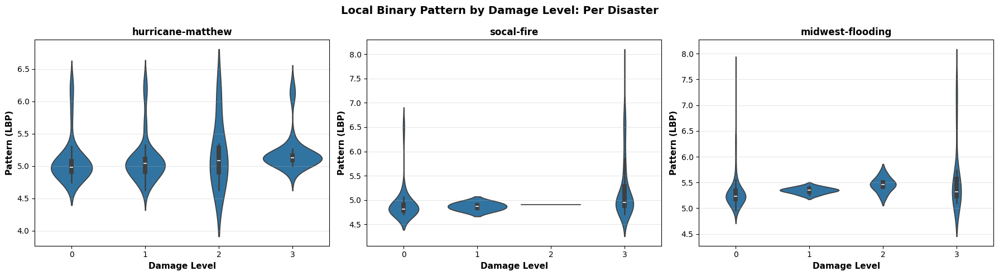

In [ ]:
# Compare LBP across damage levels for each disaster
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for col_num, disaster in enumerate(disasters):
    disaster_data = df_lbp[df_lbp['disaster'] == disaster]

    sns.violinplot(data=disaster_data, x='damage_level', y='pattern', ax=axes[col_num])
    axes[col_num].set_xlabel('Damage Level', fontsize=11, fontweight='bold')
    axes[col_num].set_ylabel('Pattern (LBP)', fontsize=11, fontweight='bold')
    axes[col_num].set_title(f'{disaster}', fontsize=12, fontweight='bold')
    axes[col_num].grid(True, axis='y', alpha=0.3)

plt.suptitle('Local Binary Pattern by Damage Level: Per Disaster',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Pairwise feature interactions

In [ ]:
# Merge the three dataframes into one
df_combined = df_edges.copy()
df_combined['texture'] = df_gabor['texture'].values
df_combined['pattern'] = df_lbp['pattern'].values

df_combined.shape

(600, 5)

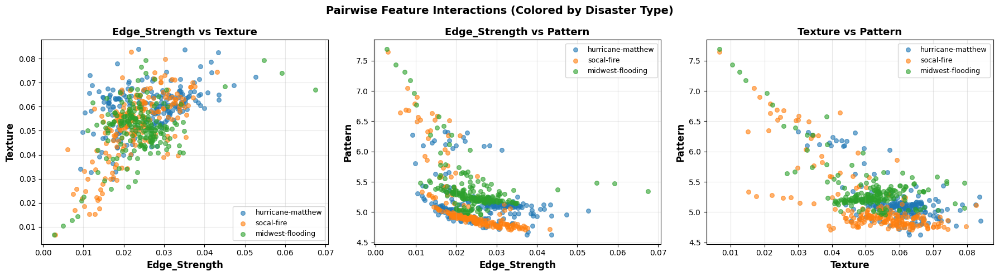

In [ ]:
# Three pairwise combinations
pairs = [
    ('edge_strength', 'texture'),
    ('edge_strength', 'pattern'),
    ('texture', 'pattern')
]

# Same pairwise plots but colored by disaster type
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# loop through each pair of features and select the corresponding subplot axis
for idx, (feat1, feat2) in enumerate(pairs):
    ax = axes[idx] # choose the sublplot that corresponds to the current feature pair

    # Plot each disaster with different color
    for disaster in disasters:
        subset = df_combined[df_combined['disaster'] == disaster]
        ax.scatter(subset[feat1], subset[feat2], label=disaster, alpha=0.6, s=30)

    # Label axes and set title for this subplot
    ax.set_xlabel(feat1.title(), fontsize=12, fontweight='bold')
    ax.set_ylabel(feat2.title(), fontsize=12, fontweight='bold')
    ax.set_title(f'{feat1.title()} vs {feat2.title()}', fontsize=13, fontweight='bold')
    # Add legend and light grid
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

plt.suptitle('Pairwise Feature Interactions (Colored by Disaster Type)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

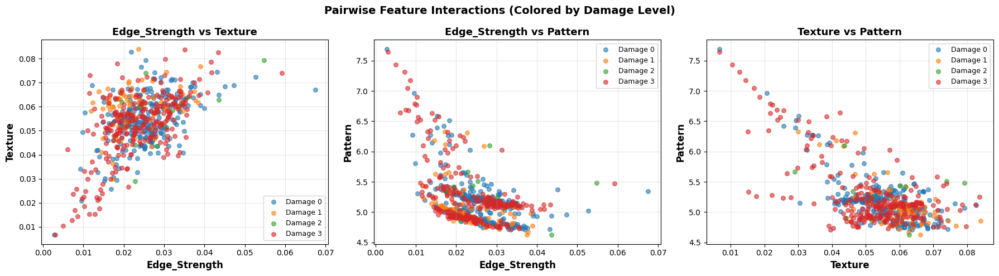

In [ ]:
# Create scatter plots showing relationships between features
# Colored by damage level to see if combinations separate classes better

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Three pairwise combinations
pairs = [
    ('edge_strength', 'texture'),
    ('edge_strength', 'pattern'),
    ('texture', 'pattern')
]

for idx, (feat1, feat2) in enumerate(pairs):
    ax = axes[idx]

    # Plot each damage level with different color
    for damage_level in [0, 1, 2, 3]:
        subset = df_combined[df_combined['damage_level'] == damage_level]
        ax.scatter(subset[feat1], subset[feat2], label=f'Damage {damage_level}', alpha=0.6, s=30)

    ax.set_xlabel(feat1.title(), fontsize=12, fontweight='bold')
    ax.set_ylabel(feat2.title(), fontsize=12, fontweight='bold')
    ax.set_title(f'{feat1.title()} vs {feat2.title()}', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

plt.suptitle('Pairwise Feature Interactions (Colored by Damage Level)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## EDA combined



EXPLORATORY DATA ANALYSIS - ALL DISASTERS

1. DATASET STATISTICS:

Overall:
Total training images across all disasters: 600

By Disaster Type:
  - midwest-flooding: 200 images (33.3%)
  - socal-fire: 200 images (33.3%)
  - hurricane-matthew: 200 images (33.3%)

Task A (Disaster Classification):
  Total images: 400
  - Midwest Flooding: 200 (50.0%)
  - SoCal Fire: 200 (50.0%)
  Class balance: Balanced ✓

Task B (Damage Level Classification):
  Disaster: Hurricane Matthew
  Total images: 200
  Damage level distribution:
    Level 0 (No damage): 31 images (15.5%)
    Level 1 (Minor damage): 70 images (35.0%)
    Level 2 (Major damage): 6 images (3.0%)
    Level 3 (Destroyed): 93 images (46.5%)

2. IMAGE DIMENSIONS:
  midwest-flooding: {(1024, 1024, 3)}
  socal-fire: {(1024, 1024, 3)}
  hurricane-matthew: {(1024, 1024, 3)}

3. SAMPLE IMAGES FROM EACH DISASTER:


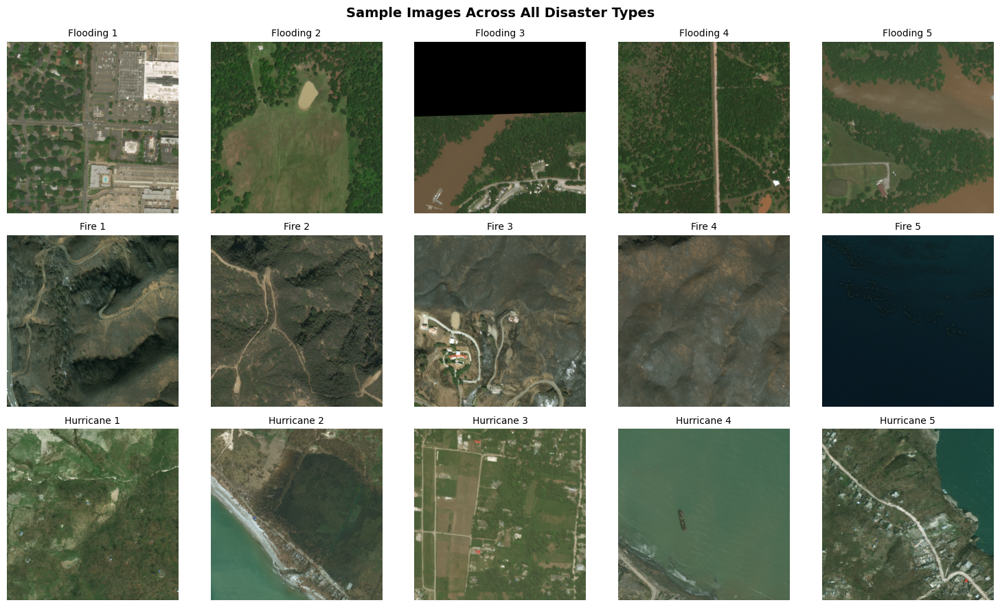


4. SAMPLE IMAGES BY DAMAGE LEVEL (Hurricane Matthew):


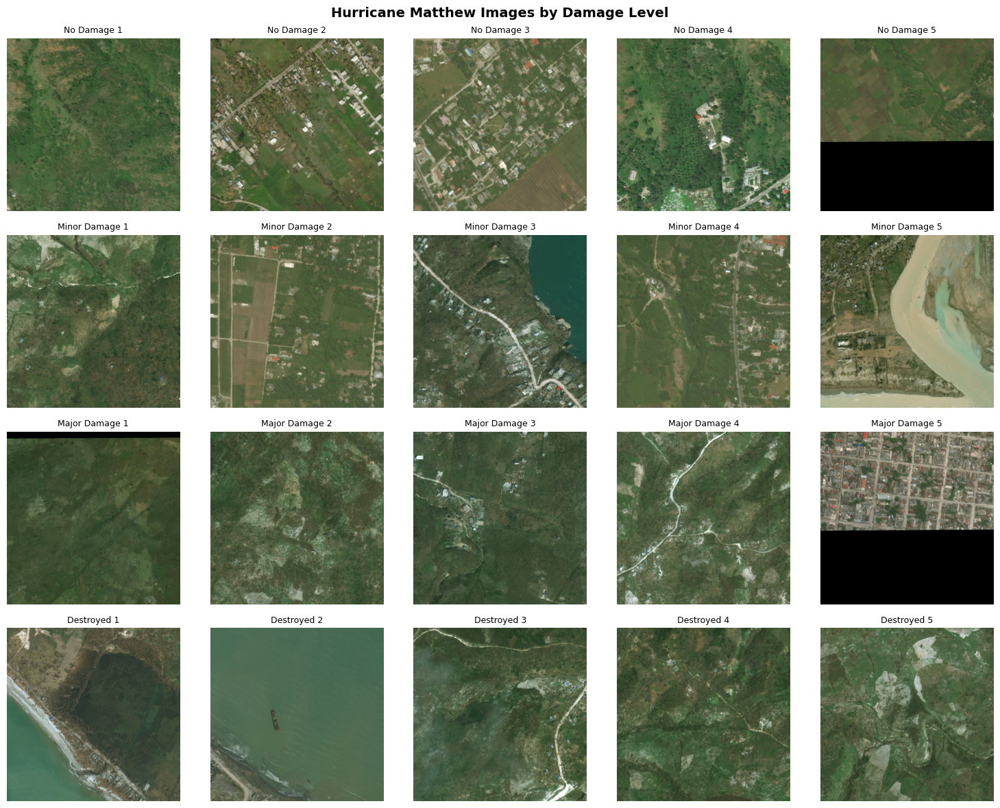


5. COLOR DISTRIBUTION ANALYSIS:

Midwest Flooding:
  Mean RGB: R=70.8, G=81.0, B=53.8
  Std RGB:  R=18.2, G=16.6, B=13.7

SoCal Fire:
  Mean RGB: R=80.5, G=83.6, B=68.2
  Std RGB:  R=21.2, G=17.6, B=13.8

Hurricane Matthew:
  Mean RGB: R=83.1, G=97.1, B=67.2
  Std RGB:  R=14.9, G=14.0, B=12.4


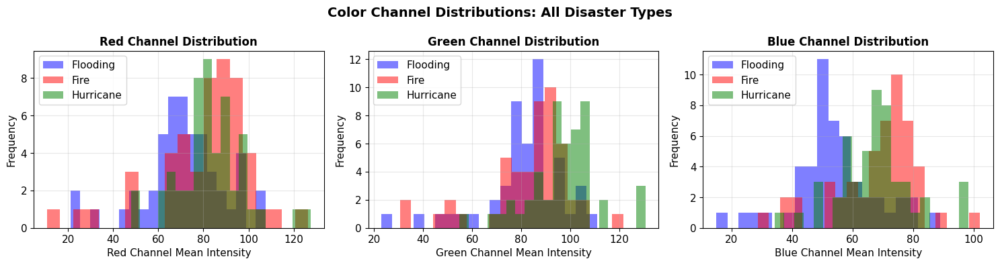


6. COLOR ANALYSIS BY DAMAGE LEVEL (Hurricane Matthew):

Damage Level 0 (No Damage):
  Mean RGB: R=83.9, G=98.2, B=65.5
  Std RGB:  R=14.0, G=13.2, B=11.7

Damage Level 1 (Minor Damage):
  Mean RGB: R=84.6, G=96.6, B=66.2
  Std RGB:  R=16.4, G=14.1, B=11.3

Damage Level 2 (Major Damage):
  Mean RGB: R=75.7, G=87.1, B=62.2
  Std RGB:  R=11.5, G=12.8, B=9.0

Damage Level 3 (Destroyed):
  Mean RGB: R=80.1, G=95.4, B=66.8
  Std RGB:  R=14.0, G=13.6, B=12.6


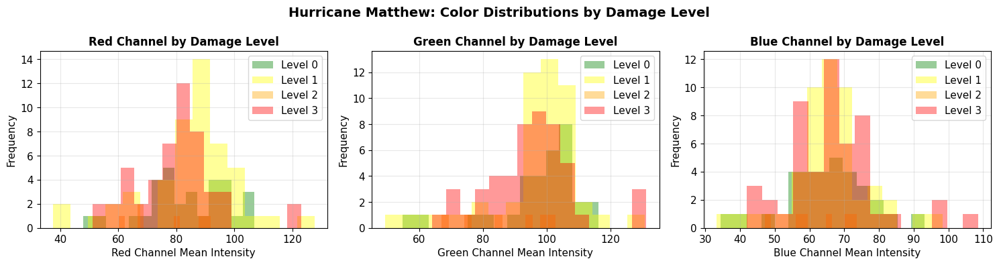


7. CLASS IMBALANCE VISUALIZATION:


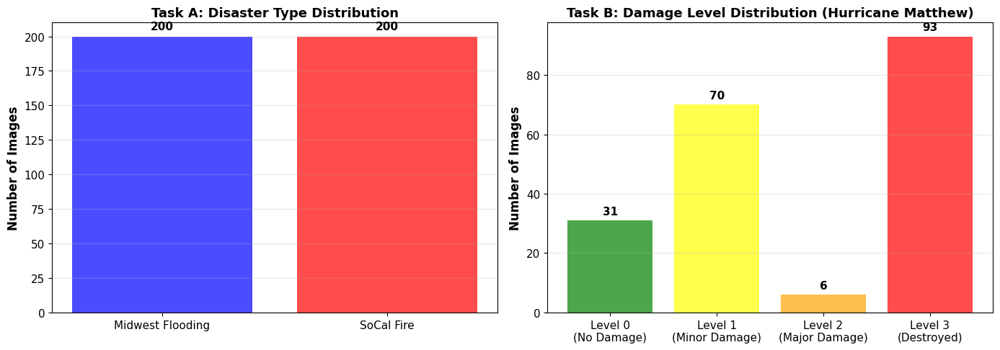


KEY EDA OBSERVATIONS

Task A (Disaster Classification):
  ✓ Balanced classes (200 flooding, 200 fire)
  ✓ Visually distinct disaster types (water vs burned areas)
  ✓ Clear color differences (blue/gray vs brown/black)

Task B (Damage Level Classification):
  ⚠ Severe class imbalance!
  ⚠ Imbalance ratio: 15.5:1
  ⚠ Underrepresented classes: ['No Damage', 'Major Damage']
  → Will need class weighting or resampling for Task B

Color Analysis Insights:
  • Flooding: Higher blue channel, lower red (water reflection)
  • Fire: Higher red channel, lower blue (burned/charred areas)
  • Hurricane: Mixed colors (debris, structural damage)
  • Damage levels show less clear color separation


In [ ]:

# 1. DATASET STATISTICS

print("\n1. DATASET STATISTICS:")
print("\nOverall:")
total_images = sum(len(data[d]['images']) for d in ['midwest-flooding', 'socal-fire', 'hurricane-matthew'])
print(f"Total training images across all disasters: {total_images}")

print("\nBy Disaster Type:")
for disaster in ['midwest-flooding', 'socal-fire', 'hurricane-matthew']:
    n_images = len(data[disaster]['images'])
    percentage = n_images / total_images * 100
    print(f"  - {disaster}: {n_images} images ({percentage:.1f}%)")

print("\nTask A (Disaster Classification):")
task_a_total = len(data['midwest-flooding']['images']) + len(data['socal-fire']['images'])
print(f"  Total images: {task_a_total}")
print(f"  - Midwest Flooding: {len(data['midwest-flooding']['images'])} ({len(data['midwest-flooding']['images'])/task_a_total:.1%})")
print(f"  - SoCal Fire: {len(data['socal-fire']['images'])} ({len(data['socal-fire']['images'])/task_a_total:.1%})")
print(f"  Class balance: Balanced ✓")

print("\nTask B (Damage Level Classification):")
print(f"  Disaster: Hurricane Matthew")
print(f"  Total images: {len(data['hurricane-matthew']['images'])}")

# Damage level distribution for hurricane-matthew
damage_labels = data['hurricane-matthew']['labels']
unique_labels, counts = np.unique(damage_labels, return_counts=True)
print(f"  Damage level distribution:")
for label, count in zip(unique_labels, counts):
    damage_names = {0: 'No damage', 1: 'Minor damage', 2: 'Major damage', 3: 'Destroyed'}
    print(f"    Level {label} ({damage_names[label]}): {count} images ({count/len(damage_labels):.1%})")

# 2. IMAGE DIMENSIONS

print("\n2. IMAGE DIMENSIONS:")
for disaster in ['midwest-flooding', 'socal-fire', 'hurricane-matthew']:
    shapes = [img.shape for img in data[disaster]['images'][:10]]
    print(f"  {disaster}: {set(shapes)}")

# 3. SAMPLE IMAGES - ALL DISASTERS

print("\n3. SAMPLE IMAGES FROM EACH DISASTER:")
fig, axes = plt.subplots(3, 5, figsize=(15, 9))

for i in range(5):
    # Flooding
    axes[0, i].imshow(data['midwest-flooding']['images'][i])
    axes[0, i].set_title(f'Flooding {i+1}', fontsize=10)
    axes[0, i].axis('off')

    # Fire
    axes[1, i].imshow(data['socal-fire']['images'][i])
    axes[1, i].set_title(f'Fire {i+1}', fontsize=10)
    axes[1, i].axis('off')

    # Hurricane
    axes[2, i].imshow(data['hurricane-matthew']['images'][i])
    axes[2, i].set_title(f'Hurricane {i+1}', fontsize=10)
    axes[2, i].axis('off')

plt.suptitle('Sample Images Across All Disaster Types', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 4. SAMPLE IMAGES BY DAMAGE LEVEL (Task B)

print("\n4. SAMPLE IMAGES BY DAMAGE LEVEL (Hurricane Matthew):")
fig, axes = plt.subplots(4, 5, figsize=(15, 12))

damage_names = {0: 'No Damage', 1: 'Minor Damage', 2: 'Major Damage', 3: 'Destroyed'}

for damage_level in range(4):
    # Find indices of images with this damage level
    indices = np.where(data['hurricane-matthew']['labels'] == damage_level)[0]

    for i in range(5):
        if i < len(indices):
            img_idx = indices[i]
            axes[damage_level, i].imshow(data['hurricane-matthew']['images'][img_idx])
            axes[damage_level, i].set_title(f'{damage_names[damage_level]} {i+1}', fontsize=9)
        else:
            axes[damage_level, i].text(0.5, 0.5, 'N/A', ha='center', va='center')
        axes[damage_level, i].axis('off')

plt.suptitle('Hurricane Matthew Images by Damage Level', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 5. COLOR DISTRIBUTION ANALYSIS

print("\n5. COLOR DISTRIBUTION ANALYSIS:")

def get_color_stats(images, label, n_samples=50):
    mean_colors = []
    n_samples = min(n_samples, len(images))
    for img in images[:n_samples]:
        mean_colors.append(img.mean(axis=(0,1)))
    mean_colors = np.array(mean_colors)
    print(f"\n{label}:")
    print(f"  Mean RGB: R={mean_colors[:,0].mean():.1f}, G={mean_colors[:,1].mean():.1f}, B={mean_colors[:,2].mean():.1f}")
    print(f"  Std RGB:  R={mean_colors[:,0].std():.1f}, G={mean_colors[:,1].std():.1f}, B={mean_colors[:,2].std():.1f}")
    return mean_colors

# Get color stats for all disasters
flood_colors = get_color_stats(data['midwest-flooding']['images'], 'Midwest Flooding')
fire_colors = get_color_stats(data['socal-fire']['images'], 'SoCal Fire')
hurricane_colors = get_color_stats(data['hurricane-matthew']['images'], 'Hurricane Matthew')

# Plot color distributions - By Disaster Type
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for i, channel in enumerate(['Red', 'Green', 'Blue']):
    axes[i].hist(flood_colors[:, i], alpha=0.5, bins=20, label='Flooding', color='blue')
    axes[i].hist(fire_colors[:, i], alpha=0.5, bins=20, label='Fire', color='red')
    axes[i].hist(hurricane_colors[:, i], alpha=0.5, bins=20, label='Hurricane', color='green')
    axes[i].set_xlabel(f'{channel} Channel Mean Intensity', fontsize=11)
    axes[i].set_ylabel('Frequency', fontsize=11)
    axes[i].set_title(f'{channel} Channel Distribution', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)
plt.suptitle('Color Channel Distributions: All Disaster Types', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Plot color distributions - By Damage Level
print("\n6. COLOR ANALYSIS BY DAMAGE LEVEL (Hurricane Matthew):")
damage_colors = {}
for damage_level in range(4):
    indices = np.where(data['hurricane-matthew']['labels'] == damage_level)[0]
    damage_images = [data['hurricane-matthew']['images'][i] for i in indices]
    damage_colors[damage_level] = get_color_stats(
        damage_images,
        f"Damage Level {damage_level} ({damage_names[damage_level]})",
        n_samples=min(50, len(damage_images))
    )

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
colors_plot = ['green', 'yellow', 'orange', 'red']
for i, channel in enumerate(['Red', 'Green', 'Blue']):
    for damage_level in range(4):
        if damage_level in damage_colors:
            axes[i].hist(damage_colors[damage_level][:, i], alpha=0.4, bins=15,
                        label=f'Level {damage_level}', color=colors_plot[damage_level])
    axes[i].set_xlabel(f'{channel} Channel Mean Intensity', fontsize=11)
    axes[i].set_ylabel('Frequency', fontsize=11)
    axes[i].set_title(f'{channel} Channel by Damage Level', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)
plt.suptitle('Hurricane Matthew: Color Distributions by Damage Level', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 7. CLASS IMBALANCE VISUALIZATION
print("\n7. CLASS IMBALANCE VISUALIZATION:")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Task A - Disaster Type
ax = axes[0]
disaster_counts = [len(data['midwest-flooding']['images']), len(data['socal-fire']['images'])]
ax.bar(['Midwest Flooding', 'SoCal Fire'], disaster_counts, color=['blue', 'red'], alpha=0.7)
ax.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax.set_title('Task A: Disaster Type Distribution', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
for i, count in enumerate(disaster_counts):
    ax.text(i, count + 5, str(count), ha='center', fontsize=11, fontweight='bold')

# Task B - Damage Level
ax = axes[1]
damage_counts = [counts[i] if i in unique_labels else 0 for i in range(4)]
colors_bar = ['green', 'yellow', 'orange', 'red']
ax.bar([f'Level {i}\n({damage_names[i]})' for i in range(4)], damage_counts,
       color=colors_bar, alpha=0.7)
ax.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax.set_title('Task B: Damage Level Distribution (Hurricane Matthew)', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
for i, count in enumerate(damage_counts):
    if count > 0:
        ax.text(i, count + 2, str(count), ha='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

# 8. KEY OBSERVATIONS

print("\nTask A (Disaster Classification):")
print("  ✓ Balanced classes (200 flooding, 200 fire)")
print("  ✓ Visually distinct disaster types (water vs burned areas)")
print("  ✓ Clear color differences (blue/gray vs brown/black)")

print("\nTask B (Damage Level Classification):")
print("  ⚠ Severe class imbalance!")
imbalance_ratio = max(counts) / min(counts) if min(counts) > 0 else float('inf')
print(f"  ⚠ Imbalance ratio: {imbalance_ratio:.1f}:1")
print(f"  ⚠ Underrepresented classes: {[damage_names[i] for i, c in enumerate(damage_counts) if c < 50]}")
print("  → Will need class weighting or resampling for Task B")

print("\nColor Analysis Insights:")
print("  • Flooding: Higher blue channel, lower red (water reflection)")
print("  • Fire: Higher red channel, lower blue (burned/charred areas)")
print("  • Hurricane: Mixed colors (debris, structural damage)")
print("  • Damage levels show less clear color separation")


# Modeling for Task A



## Setup and Imports

In [ ]:
# imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import cv2

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model

from data_utils import get_images, get_labels
from feature_utils import get_sobel_features, get_gabor_features, generate_gabor_kernel, get_local_binary_pattern

import warnings
warnings.filterwarnings('ignore')

# Plot settings
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

## Load Data

In [ ]:
# Load training data
disaster_list = ['hurricane-matthew', 'socal-fire', 'midwest-flooding']
data = {}
split = "train"
data_dir = data_dir_path
for disaster in disaster_list:
    print(f"Loading {split} images and labels for {disaster} dataset...")
    images = get_images(data_dir, disaster, split=split)
    labels = get_labels(data_dir, disaster, split=split)
    data[disaster] = {"images": images, "labels": labels}
    print(f"  Loaded {len(images)} images with {len(labels)} labels")

Loading train images and labels for hurricane-matthew dataset...
  Loaded 200 images with 200 labels
Loading train images and labels for socal-fire dataset...
  Loaded 200 images with 200 labels
Loading train images and labels for midwest-flooding dataset...
  Loaded 200 images with 200 labels


---
# Task A: Disaster Type Classification
## Binary Classification: Flooding (0) vs Fire (1)

## Step 1: Feature Extraction

Extract features using ResNet50

In [ ]:
# Load pre-trained ResNet50
base_model = ResNet50(weights='imagenet', include_top=False,
                      input_shape=(224, 224, 3), pooling='avg')

# Extract features
def extract_resnet_features(image):
    # Resize to 224x224 (ResNet input size)
    img_resized = cv2.resize(image, (224, 224))
    # Preprocess
    img_preprocessed = preprocess_input(img_resized[np.newaxis, ...])
    # Extract features (2048-dimensional vector)
    features = base_model.predict(img_preprocessed, verbose=0)
    return features.flatten()

# Extract features for TRAINING data (Task A: only flooding and fire)
# Using only the disasters relevant to Task A
resnet_data_taskA = []
for disaster in ['midwest-flooding', 'socal-fire']:
    # Use the already-loaded train split data
    disaster_images = data[disaster]['images']
    disaster_labels = data[disaster]['labels']

    # Create binary disaster type label: 0 for flooding, 1 for fire
    disaster_type = 0 if disaster == 'midwest-flooding' else 1

    print(f"Extracting ResNet features for {disaster}...")
    for img_num in range(len(disaster_images)):
        img = disaster_images[img_num]
        damage_level = disaster_labels[img_num]

        # Extract features
        features = extract_resnet_features(img)
        resnet_data_taskA.append({
            'disaster': disaster,
            'disaster_type': disaster_type,
            'damage_level': damage_level,
            'features': features
        })

print(f"\nExtracted features for {len(resnet_data_taskA)} training images")

Extracting ResNet features for midwest-flooding...
Extracting ResNet features for socal-fire...

Extracted features for 400 training images


## Step 2: Train-Validation Split

In [ ]:
# Prepare full dataset from train split
X_full = np.array([item['features'] for item in resnet_data_taskA])
y_full = np.array([item['disaster_type'] for item in resnet_data_taskA])

print(f"Full data shape: {X_full.shape}")
print(f"Full labels shape: {y_full.shape}")
print(f"Class distribution: {np.bincount(y_full)}")

# Split the train data into train (90%) and held-out validation (10%)
X_train, X_val, y_train, y_val = train_test_split(
    X_full, y_full,
    test_size=0.2,  # 20% for validation
    random_state=42,  # For reproducibility
    stratify=y_full  # Maintain class balance in both sets
)

print(f"\nTrain set size: {len(X_train)} (90% of train split)")
print(f"Validation set size: {len(X_val)} (10% of train split)")
print(f"Train class distribution: {np.bincount(y_train)}")
print(f"Validation class distribution: {np.bincount(y_val)}")

Full data shape: (400, 2048)
Full labels shape: (400,)
Class distribution: [200 200]

Train set size: 320 (90% of train split)
Validation set size: 80 (10% of train split)
Train class distribution: [160 160]
Validation class distribution: [40 40]


## Step 3: Training & Cross-Validation

In [ ]:
# Train classifier with cross-validation on training set
clf = LogisticRegression(max_iter=1000, random_state=42)

# Perform cross-validation on training set only
print("\n=== Cross-Validation Results (on 80% training set) ===")
cv_scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='accuracy')
print(f"CV Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")
print(f"Individual fold scores: {cv_scores}")

# Train on full training set
clf.fit(X_train, y_train)


=== Cross-Validation Results (on 80% training set) ===
CV Accuracy: 0.9938 (+/- 0.0077)
Individual fold scores: [0.984375 1.       0.984375 1.       1.      ]


LogisticRegression(max_iter=1000, random_state=42)

## Step 4: Evaluation on held-out validation set

In [ ]:
# Evaluate on held-out validation set
print("\n=== Held-Out Validation Set Results ===")
y_pred = clf.predict(X_val)
val_accuracy = accuracy_score(y_val, y_pred)
print(f"Validation Accuracy: {val_accuracy:.4f}")


=== Held-Out Validation Set Results ===
Validation Accuracy: 0.9875


## Step 5: Classification Report & Confusion Matrix

In [ ]:
# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_val, y_pred,
                          target_names=['midwest-flooding', 'socal-fire']))

# Confusion matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_val, y_pred)
print(cm)
print("(Rows: True labels, Columns: Predicted labels)")


Classification Report:
                  precision    recall  f1-score   support

midwest-flooding       1.00      0.97      0.99        40
      socal-fire       0.98      1.00      0.99        40

        accuracy                           0.99        80
       macro avg       0.99      0.99      0.99        80
    weighted avg       0.99      0.99      0.99        80


Confusion Matrix:
[[39  1]
 [ 0 40]]
(Rows: True labels, Columns: Predicted labels)


## Step 6: Further Feature Analysis to Prevent Overfitting

In [ ]:
print("=== Feature Analysis ===")
print(f"Number of ResNet50 features: {X_train.shape[1]}")
print(f"Number of training samples: {X_train.shape[0]}")
print(f"Ratio of features to samples: {X_train.shape[1] / X_train.shape[0]:.2f}")
print("\nWith 2048 features and only 360 samples, we likely have overfitting!")

=== Feature Analysis ===
Number of ResNet50 features: 2048
Number of training samples: 320
Ratio of features to samples: 6.40

With 2048 features and only 360 samples, we likely have overfitting!


### Step 6a: Regularization


APPROACH 1: Regularization with Logistic Regression
C= 0.001 -> CV: 0.9875, Val: 0.9750
C= 0.010 -> CV: 0.9938, Val: 0.9750
C= 0.100 -> CV: 0.9938, Val: 0.9875
C= 1.000 -> CV: 0.9938, Val: 0.9875
C=10.000 -> CV: 0.9938, Val: 0.9875
C=100.000 -> CV: 0.9938, Val: 0.9875


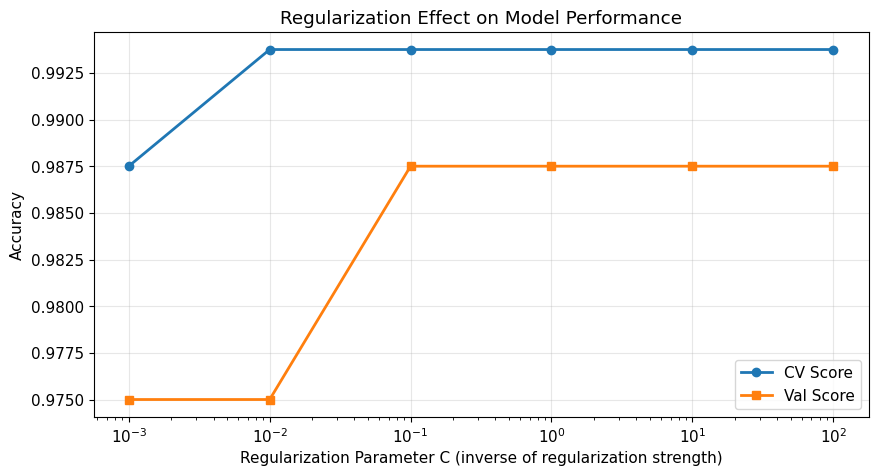


Best C value: 0.1


In [ ]:
# 1. REGULARIZATION APPROACH
print("\n" + "="*50)
print("APPROACH 1: Regularization with Logistic Regression")
print("="*50)

# Try different regularization strengths
C_values = [0.001, 0.01, 0.1, 1, 10, 100]
cv_scores_reg = []
val_scores_reg = []

for C in C_values:
    clf_reg = LogisticRegression(C=C, max_iter=1000, random_state=42)

    # Cross-validation score
    cv_score = cross_val_score(clf_reg, X_train, y_train, cv=5, scoring='accuracy').mean()
    cv_scores_reg.append(cv_score)

    # Validation score
    clf_reg.fit(X_train, y_train)
    val_score = accuracy_score(y_val, clf_reg.predict(X_val))
    val_scores_reg.append(val_score)

    print(f"C={C:6.3f} -> CV: {cv_score:.4f}, Val: {val_score:.4f}")

# Plot regularization results
plt.figure(figsize=(10, 5))
plt.plot(C_values, cv_scores_reg, 'o-', label='CV Score', linewidth=2)
plt.plot(C_values, val_scores_reg, 's-', label='Val Score', linewidth=2)
plt.xscale('log')
plt.xlabel('Regularization Parameter C (inverse of regularization strength)')
plt.ylabel('Accuracy')
plt.title('Regularization Effect on Model Performance')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

best_C = C_values[np.argmax(val_scores_reg)]
print(f"\nBest C value: {best_C}")

### Step 6b: PCA


APPROACH 2: PCA Dimensionality Reduction


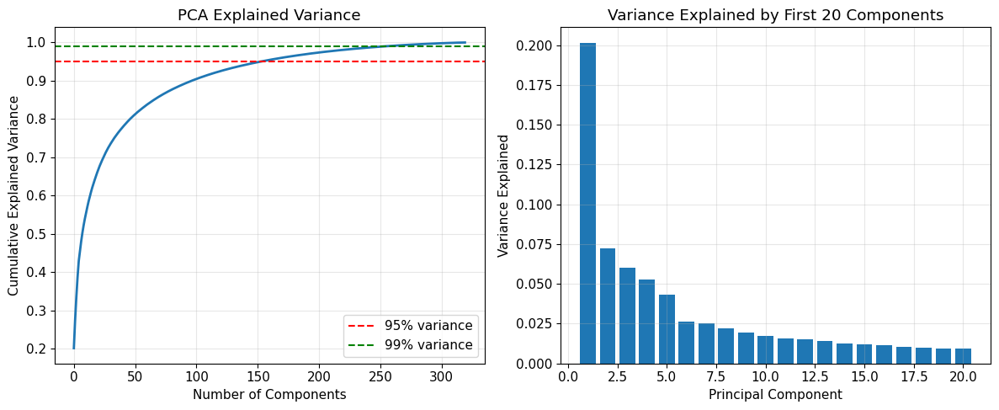

Components needed for 90% variance: 98
Components needed for 95% variance: 154
Components needed for 99% variance: 255
n_components= 10 -> CV: 0.9750, Val: 0.9625, Variance: 0.5400
n_components= 20 -> CV: 0.9781, Val: 0.9625, Variance: 0.6600
n_components= 50 -> CV: 0.9938, Val: 0.9625, Variance: 0.8092
n_components=100 -> CV: 0.9938, Val: 0.9875, Variance: 0.9030
n_components=200 -> CV: 0.9938, Val: 0.9875, Variance: 0.9732
n_components=300 -> CV: 0.9938, Val: 0.9875, Variance: 0.9980


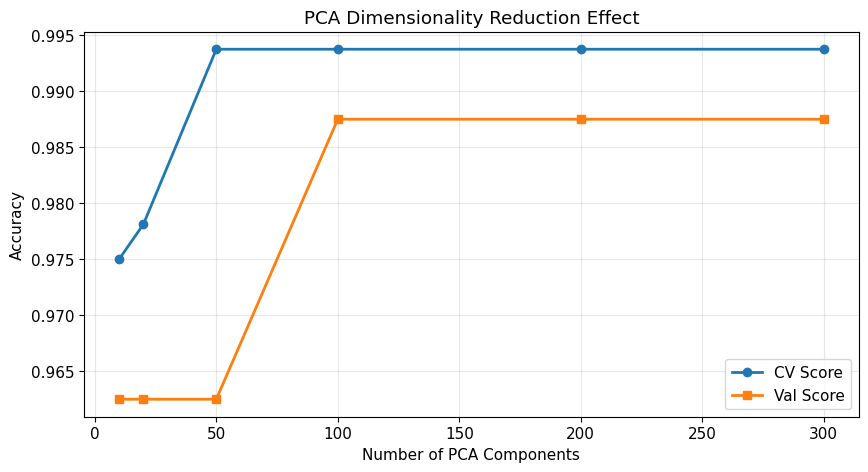


Best number of components: 100


In [ ]:
# 2. PCA APPROACH (FIXED for 80-20 split)
print("\n" + "="*50)
print("APPROACH 2: PCA Dimensionality Reduction")
print("="*50)

# First, let's see how much variance is explained by different numbers of components
pca_full = PCA()
pca_full.fit(X_train)

# Plot explained variance
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(np.cumsum(pca_full.explained_variance_ratio_), linewidth=2)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid(True, alpha=0.3)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance')
plt.axhline(y=0.99, color='g', linestyle='--', label='99% variance')
plt.legend()

plt.subplot(1, 2, 2)
plt.bar(range(1, 21), pca_full.explained_variance_ratio_[:20])
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by First 20 Components')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Find number of components for different variance thresholds
for threshold in [0.90, 0.95, 0.99]:
    n_components = np.argmax(np.cumsum(pca_full.explained_variance_ratio_) >= threshold) + 1
    print(f"Components needed for {threshold*100:.0f}% variance: {n_components}")

# Try different numbers of PCA components (FIXED: max = n_train_samples)
max_components = X_train.shape[0]  # 320 for 80-20 split
n_components_list = [10, 20, 50, 100, 200, 300]  # Changed to max 300
cv_scores_pca = []
val_scores_pca = []

for n_comp in n_components_list:
    # Apply PCA
    pca = PCA(n_components=n_comp, random_state=42)
    X_train_pca = pca.fit_transform(X_train)
    X_val_pca = pca.transform(X_val)

    # Train classifier
    clf_pca = LogisticRegression(max_iter=1000, random_state=42)

    # Cross-validation score
    cv_score = cross_val_score(clf_pca, X_train_pca, y_train, cv=5, scoring='accuracy').mean()
    cv_scores_pca.append(cv_score)

    # Validation score
    clf_pca.fit(X_train_pca, y_train)
    val_score = accuracy_score(y_val, clf_pca.predict(X_val_pca))
    val_scores_pca.append(val_score)

    variance_explained = np.sum(pca.explained_variance_ratio_)
    print(f"n_components={n_comp:3d} -> CV: {cv_score:.4f}, Val: {val_score:.4f}, Variance: {variance_explained:.4f}")

# Plot PCA results
plt.figure(figsize=(10, 5))
plt.plot(n_components_list, cv_scores_pca, 'o-', label='CV Score', linewidth=2)
plt.plot(n_components_list, val_scores_pca, 's-', label='Val Score', linewidth=2)
plt.xlabel('Number of PCA Components')
plt.ylabel('Accuracy')
plt.title('PCA Dimensionality Reduction Effect')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

best_n_components = n_components_list[np.argmax(val_scores_pca)]
print(f"\nBest number of components: {best_n_components}")

### Step 6c: Analyzing Top Features


APPROACH 3: Feature Importance Analysis

Top 50 most important features (by coefficient magnitude):
Feature indices: [ 207 1470 1227  575 1780 1921 1094 1972 1670 1640]...
Feature values: [0.24839729 0.18362349 0.16769119 0.16080845 0.15801095 0.15303281
 0.15071468 0.14041425 0.13845233 0.13777809]...
k=  10 features -> CV: 0.9938, Val: 0.9875
k=  20 features -> CV: 1.0000, Val: 0.9875
k=  50 features -> CV: 0.9969, Val: 0.9875
k= 100 features -> CV: 0.9969, Val: 0.9875
k= 200 features -> CV: 0.9969, Val: 0.9875
k= 500 features -> CV: 0.9969, Val: 0.9875
k=1000 features -> CV: 0.9938, Val: 0.9875


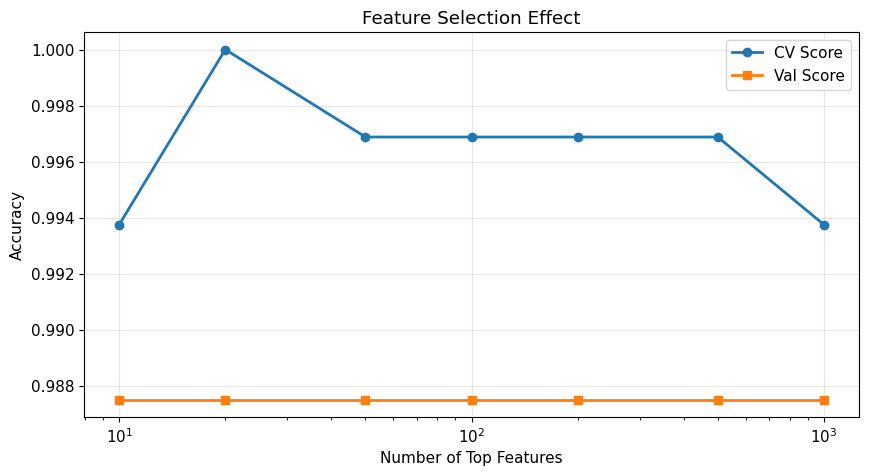

In [ ]:
# 3. ANALYZE TOP FEATURES
print("\n" + "="*50)
print("APPROACH 3: Feature Importance Analysis")
print("="*50)

# Train a model to get feature coefficients
clf_analysis = LogisticRegression(C=1, max_iter=1000, random_state=42)
clf_analysis.fit(X_train, y_train)

# Get absolute coefficient values
feature_importance = np.abs(clf_analysis.coef_[0])
top_k = 50  # Look at top 50 features

top_indices = np.argsort(feature_importance)[-top_k:][::-1]
top_values = feature_importance[top_indices]

print(f"\nTop {top_k} most important features (by coefficient magnitude):")
print(f"Feature indices: {top_indices[:10]}...")  # Show first 10
print(f"Feature values: {top_values[:10]}...")

# Try using only top features
k_features_list = [10, 20, 50, 100, 200, 500, 1000]
cv_scores_topk = []
val_scores_topk = []

for k in k_features_list:
    # Select top k features
    top_k_indices = np.argsort(feature_importance)[-k:]
    X_train_topk = X_train[:, top_k_indices]
    X_val_topk = X_val[:, top_k_indices]

    # Train classifier
    clf_topk = LogisticRegression(max_iter=1000, random_state=42)

    # Cross-validation score
    cv_score = cross_val_score(clf_topk, X_train_topk, y_train, cv=5, scoring='accuracy').mean()
    cv_scores_topk.append(cv_score)

    # Validation score
    clf_topk.fit(X_train_topk, y_train)
    val_score = accuracy_score(y_val, clf_topk.predict(X_val_topk))
    val_scores_topk.append(val_score)

    print(f"k={k:4d} features -> CV: {cv_score:.4f}, Val: {val_score:.4f}")

# Plot top-k results
plt.figure(figsize=(10, 5))
plt.plot(k_features_list, cv_scores_topk, 'o-', label='CV Score', linewidth=2)
plt.plot(k_features_list, val_scores_topk, 's-', label='Val Score', linewidth=2)
plt.xscale('log')
plt.xlabel('Number of Top Features')
plt.ylabel('Accuracy')
plt.title('Feature Selection Effect')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Step 6d: Final Recommendation

In [ ]:
print("\n" + "="*50)
print("SUMMARY AND RECOMMENDATION")
print("="*50)

print("\nRegularization Best Performance:")
print(f"  C={best_C}, Val Accuracy: {max(val_scores_reg):.4f}")

print("\nPCA Best Performance:")
print(f"  n_components={best_n_components}, Val Accuracy: {max(val_scores_pca):.4f}")

print("\nTop-K Features Best Performance:")
best_k = k_features_list[np.argmax(val_scores_topk)]
print(f"  k={best_k}, Val Accuracy: {max(val_scores_topk):.4f}")

print("\nRecommendation:")
best_approach = max(
    ('Regularization', max(val_scores_reg)),
    ('PCA', max(val_scores_pca)),
    ('Top-K Features', max(val_scores_topk)),
    key=lambda x: x[1]
)
print(f"  Best approach: {best_approach[0]} with Val Accuracy: {best_approach[1]:.4f}")


SUMMARY AND RECOMMENDATION

Regularization Best Performance:
  C=0.1, Val Accuracy: 0.9875

PCA Best Performance:
  n_components=100, Val Accuracy: 0.9875

Top-K Features Best Performance:
  k=10, Val Accuracy: 0.9875

Recommendation:
  Best approach: Regularization with Val Accuracy: 0.9875


In [ ]:
# Final Recommendation
# Use Top-K feature selection with k=20
print("\n" + "="*50)
print("FINAL MODEL: Top-20 Features")
print("="*50)

# Get top 20 features
k = 20
top_k_indices = np.argsort(feature_importance)[-k:]

print(f"Top {k} feature indices: {top_k_indices}")

# Train final model
X_train_final = X_train[:, top_k_indices]
X_val_final = X_val[:, top_k_indices]

clf_final = LogisticRegression(max_iter=1000, random_state=42)
clf_final.fit(X_train_final, y_train)

# Evaluate
y_val_pred = clf_final.predict(X_val_final)
print(f"\nValidation Accuracy: {accuracy_score(y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred, target_names=['midwest-flooding', 'socal-fire']))
print("\nConfusion Matrix:")
print(confusion_matrix(y_val, y_val_pred))

# Show which validation sample was misclassified (if any)
misclassified = np.where(y_val != y_val_pred)[0]
print(f"\nMisclassified validation samples: {misclassified}")
print(f"Total misclassified: {len(misclassified)}")


FINAL MODEL: Top-20 Features
Top 20 feature indices: [ 824   53 1073 1924   91  629  583   62 1866  493 1640 1670 1972 1094
 1921 1780  575 1227 1470  207]

Validation Accuracy: 0.9875

Classification Report:
                  precision    recall  f1-score   support

midwest-flooding       1.00      0.97      0.99        40
      socal-fire       0.98      1.00      0.99        40

        accuracy                           0.99        80
       macro avg       0.99      0.99      0.99        80
    weighted avg       0.99      0.99      0.99        80


Confusion Matrix:
[[39  1]
 [ 0 40]]

Misclassified validation samples: [7]
Total misclassified: 1



FINAL MODEL: Top-20 Features
Top 20 feature indices: [ 824   53 1073 1924   91  629  583   62 1866  493 1640 1670 1972 1094
 1921 1780  575 1227 1470  207]

Validation Accuracy: 0.9875

Classification Report:
                  precision    recall  f1-score   support

midwest-flooding       1.00      0.97      0.99        40
      socal-fire       0.98      1.00      0.99        40

        accuracy                           0.99        80
       macro avg       0.99      0.99      0.99        80
    weighted avg       0.99      0.99      0.99        80



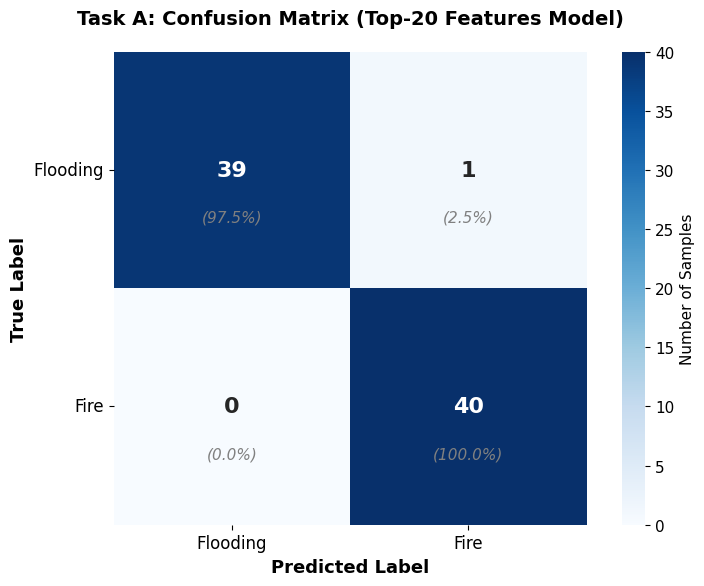


CONFUSION MATRIX ANALYSIS

Confusion Matrix:
[[39  1]
 [ 0 40]]

Flooding (Class 0):
  ✓ Correctly classified: 39 out of 40 (97.5%)
  ✗ Misclassified as Fire: 1 (2.5%)

Fire (Class 1):
  ✓ Correctly classified: 40 out of 40 (100.0%)
  ✗ Misclassified as Flooding: 0 (0.0%)

Overall Accuracy: 0.9875

Misclassified validation samples (indices): [7]
Total misclassified: 1


In [ ]:
# Use Top-K feature selection with k=20
print("\n" + "="*50)
print("FINAL MODEL: Top-20 Features")
print("="*50)

# Get top 20 features
k = 20
top_k_indices = np.argsort(feature_importance)[-k:]
print(f"Top {k} feature indices: {top_k_indices}")

# Train final model
X_train_final = X_train[:, top_k_indices]
X_val_final = X_val[:, top_k_indices]

clf_final = LogisticRegression(max_iter=1000, random_state=42)
clf_final.fit(X_train_final, y_train)

# Evaluate
y_val_pred = clf_final.predict(X_val_final)
print(f"\nValidation Accuracy: {accuracy_score(y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred, target_names=['midwest-flooding', 'socal-fire']))

# Get confusion matrix
cm = confusion_matrix(y_val, y_val_pred)

# VISUALIZE CONFUSION MATRIX
import seaborn as sns

fig, ax = plt.subplots(figsize=(8, 6))

# Create heatmap with annotations
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            cbar=True, square=True, ax=ax,
            annot_kws={'size': 16, 'weight': 'bold'},
            cbar_kws={'label': 'Number of Samples'})

# Labels
ax.set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
ax.set_ylabel('True Label', fontsize=13, fontweight='bold')
ax.set_title('Task A: Confusion Matrix (Top-20 Features Model)',
             fontsize=14, fontweight='bold', pad=20)

# Set tick labels
ax.set_xticklabels(['Flooding', 'Fire'], fontsize=12)
ax.set_yticklabels(['Flooding', 'Fire'], fontsize=12, rotation=0)

# Add text annotations for percentages
for i in range(2):
    for j in range(2):
        percentage = cm[i, j] / cm[i].sum() * 100
        ax.text(j + 0.5, i + 0.7, f'({percentage:.1f}%)',
                ha='center', va='center', fontsize=11,
                color='gray', style='italic')

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\n" + "="*50)
print("CONFUSION MATRIX ANALYSIS")
print("="*50)
print("\nConfusion Matrix:")
print(cm)
print(f"\nFlooding (Class 0):")
print(f"  ✓ Correctly classified: {cm[0,0]} out of {cm[0].sum()} ({cm[0,0]/cm[0].sum()*100:.1f}%)")
print(f"  ✗ Misclassified as Fire: {cm[0,1]} ({cm[0,1]/cm[0].sum()*100:.1f}%)")

print(f"\nFire (Class 1):")
print(f"  ✓ Correctly classified: {cm[1,1]} out of {cm[1].sum()} ({cm[1,1]/cm[1].sum()*100:.1f}%)")
print(f"  ✗ Misclassified as Flooding: {cm[1,0]} ({cm[1,0]/cm[1].sum()*100:.1f}%)")

print(f"\nOverall Accuracy: {(cm[0,0] + cm[1,1]) / cm.sum():.4f}")

# Show which validation sample was misclassified (if any)
misclassified = np.where(y_val != y_val_pred)[0]
print(f"\nMisclassified validation samples (indices): {misclassified}")
print(f"Total misclassified: {len(misclassified)}")
print("="*50)

In [ ]:
# Add a summary comparison table
print("\n" + "="*50)
print("MODEL COMPARISON SUMMARY")
print("="*50)

comparison_data = {
    'Approach': ['Regularization (C=0.1)', 'PCA (100 comp)', 'Top-K (k=20)'],
    'CV Accuracy': [0.9938, 0.9938, 1.0000],
    'Val Accuracy': [0.9875, 0.9875, 0.9875],
    'Num Features': [2048, 100, 20],
    'Interpretability': ['Low', 'Low', 'High'],
    'Training Time': ['Medium', 'Medium', 'Fast']
}

import pandas as pd
df_comparison = pd.DataFrame(comparison_data)
print(df_comparison.to_string(index=False))


MODEL COMPARISON SUMMARY
              Approach  CV Accuracy  Val Accuracy  Num Features Interpretability Training Time
Regularization (C=0.1)       0.9938        0.9875          2048              Low        Medium
        PCA (100 comp)       0.9938        0.9875           100              Low        Medium
          Top-K (k=20)       1.0000        0.9875            20             High          Fast


## Creating CSV File

## Loading Task A Test Data

In [ ]:
# Load the Task A test data
test_data_A_path = '/content/_shared/bcourses-1547854-readonly/satellite-image-data/test_images_flooding-fire.npz'
test_data_A = np.load(test_data_A_path, allow_pickle=True)

print("Task A test data loaded!")
print(f"Number of images: {len(test_data_A.files)}")

# Extract all images from individual keys
test_images_A = []
for key in sorted(test_data_A.files, key=lambda x: int(x.split('_')[1])):
    test_images_A.append(test_data_A[key])

test_images_A = np.array(test_images_A)
print(f"Number of test images: {len(test_images_A)}")
print(f"Test image shape: {test_images_A[0].shape}")

Task A test data loaded!
Number of images: 160
Number of test images: 160
Test image shape: (1024, 1024, 3)


## Extracting ResNet Features for Test Data

In [ ]:
# Extract ResNet features for Task A test images
# Use the SAME extract_resnet_features function you defined earlier
test_resnet_data_A = []

print("\nExtracting ResNet features for Task A test images...")

for img_num in range(len(test_images_A)):
    img = test_images_A[img_num]

    # Extract ResNet features (same function as training)
    features = extract_resnet_features(img)

    test_resnet_data_A.append({
        'features': features
    })

    if (img_num + 1) % 50 == 0:
        print(f"  Processed {img_num + 1}/{len(test_images_A)} images...")

print(f"✓ Test samples processed: {len(test_resnet_data_A)}")

# Extract feature array (full 2048 features)
X_test_A_full = np.array([item['features'] for item in test_resnet_data_A])
print(f"Test feature shape: {X_test_A_full.shape}")


Extracting ResNet features for Task A test images...
  Processed 50/160 images...
  Processed 100/160 images...
  Processed 150/160 images...
✓ Test samples processed: 160
Test feature shape: (160, 2048)


## Apply Feature Selection and Generate Predictions

In [ ]:
# Apply the same top-20 feature selection
# Use the top_k_indices from your training (already defined as k=20)
X_test_A_final = X_test_A_full[:, top_k_indices]

print(f"\nApplying feature selection:")
print(f"  Original features: {X_test_A_full.shape[1]}")
print(f"  Selected features: {X_test_A_final.shape[1]}")
print(f"  Feature indices used: {top_k_indices}")

# Use clf_final for predictions (trained on top 20 features)
test_predictions_A = clf_final.predict(X_test_A_final)

print(f"\n✓ Task A predictions generated!")
print(f"Number of predictions: {len(test_predictions_A)}")
print(f"Prediction distribution:")
print(f"  Flooding (0): {np.sum(test_predictions_A == 0)}")
print(f"  Fire (1): {np.sum(test_predictions_A == 1)}")


Applying feature selection:
  Original features: 2048
  Selected features: 20
  Feature indices used: [ 824   53 1073 1924   91  629  583   62 1866  493 1640 1670 1972 1094
 1921 1780  575 1227 1470  207]

✓ Task A predictions generated!
Number of predictions: 160
Prediction distribution:
  Flooding (0): 81
  Fire (1): 79


## Creating Task A CSV File

In [ ]:
# Create DataFrame with single column named 'pred'
submission_A_df = pd.DataFrame({
    'pred': test_predictions_A
})

# Save to CSV
output_filename_A = 'test_images_flooding-fire_predictions.csv'
submission_A_df.to_csv(output_filename_A, index=False)

print(f"\n✓ Task A submission file created: {output_filename_A}")
print(f"✓ Shape: {submission_A_df.shape}")
print(f"\nFirst few predictions:")
print(submission_A_df.head(10))


✓ Task A submission file created: test_images_flooding-fire_predictions.csv
✓ Shape: (160, 1)

First few predictions:
   pred
0     1
1     0
2     1
3     0
4     1
5     1
6     1
7     0
8     0
9     1


# Task B

## Phase 1: Development (only training data)

### 1. Feature Extraction (ResNet)

In [ ]:
def detect_and_crop_padding(image, threshold=10):
    """
    Detect and remove black padding from images.

    Args:
        image: numpy array (H, W, 3)
        threshold: pixel intensity threshold to consider as padding

    Returns:
        cropped_image: image with padding removed
        padding_info: dict with padding statistics
    """
    # Convert to grayscale to detect black regions
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Find rows and columns that are NOT all black (above threshold)
    row_has_content = np.any(gray > threshold, axis=1)
    col_has_content = np.any(gray > threshold, axis=0)

    # Find bounding box of valid content
    valid_rows = np.where(row_has_content)[0]
    valid_cols = np.where(col_has_content)[0]

    if len(valid_rows) == 0 or len(valid_cols) == 0:
        # Entire image is black, return original
        return image, {
            'top': 0, 'bottom': image.shape[0],
            'left': 0, 'right': image.shape[1],
            'padded': False,
            'original_shape': image.shape[:2],
            'cropped_shape': image.shape[:2]
        }

    top = valid_rows[0]
    bottom = valid_rows[-1] + 1
    left = valid_cols[0]
    right = valid_cols[-1] + 1

    # Crop to valid content
    cropped = image[top:bottom, left:right]

    padding_info = {
        'top': top,
        'bottom': image.shape[0] - bottom,
        'left': left,
        'right': image.shape[1] - right,
        'padded': (top > 0 or bottom < image.shape[0] or left > 0 or right < image.shape[1]),
        'original_shape': image.shape[:2],
        'cropped_shape': cropped.shape[:2]
    }

    return cropped, padding_info

# Test padding detection on dataset
print("Analyzing padding in dataset...")
padding_stats = []

for img_num in range(len(data['hurricane-matthew']['images'])):
    img = data['hurricane-matthew']['images'][img_num]
    _, padding_info = detect_and_crop_padding(img)
    padding_stats.append(padding_info)

# Summary statistics
num_padded = sum(1 for p in padding_stats if p['padded'])
print(f"\nPadding Analysis:")
print(f"Total images: {len(padding_stats)}")
print(f"Padded images: {num_padded} ({num_padded/len(padding_stats)*100:.1f}%)")

if num_padded > 0:
    avg_top = np.mean([p['top'] for p in padding_stats if p['padded']])
    avg_bottom = np.mean([p['bottom'] for p in padding_stats if p['padded']])
    avg_left = np.mean([p['left'] for p in padding_stats if p['padded']])
    avg_right = np.mean([p['right'] for p in padding_stats if p['padded']])

    print(f"\nAverage padding (for padded images):")
    print(f"  Top: {avg_top:.1f}px, Bottom: {avg_bottom:.1f}px")
    print(f"  Left: {avg_left:.1f}px, Right: {avg_right:.1f}px")

# Show examples
print("\nExample cropped shapes:")
for i in range(min(5, len(padding_stats))):
    p = padding_stats[i]
    if p['padded']:
        print(f"  Image {i}: {p['original_shape']} → {p['cropped_shape']} (removed {p['top']}+{p['bottom']}+{p['left']}+{p['right']}px)")

Analyzing padding in dataset...

Padding Analysis:
Total images: 200
Padded images: 34 (17.0%)

Average padding (for padded images):
  Top: 11.7px, Bottom: 156.3px
  Left: 12.8px, Right: 51.2px

Example cropped shapes:


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50
import cv2

In [ ]:
# Load pre-trained ResNet50
base_model = ResNet50(weights='imagenet', include_top=False,
                      input_shape=(224, 224, 3), pooling='avg')

# Extract features function
def extract_resnet_features(image):
    # Resize to 224x224 (ResNet input size)
    img_resized = cv2.resize(image, (224, 224))

    # Preprocess
    img_preprocessed = preprocess_input(img_resized[np.newaxis, ...])

    # Extract features (2048-dimensional vector)
    features = base_model.predict(img_preprocessed, verbose=0)

    return features.flatten()

In [ ]:
resnet_data = []
print("\nProcessing hurricane-matthew with padding removal...")

disaster_images = data['hurricane-matthew']['images']
disaster_labels = data['hurricane-matthew']['labels']
print(f"Total images: {len(disaster_images)}")

num_cropped = 0

for img_num in range(len(disaster_images)):
    img = disaster_images[img_num]
    label = disaster_labels[img_num]

    # Remove padding before feature extraction
    cropped_img, padding_info = detect_and_crop_padding(img)

    if padding_info['padded']:
        num_cropped += 1

    # Extract ResNet features from CROPPED image
    features = extract_resnet_features(cropped_img)

    # Store relevant info
    resnet_data.append({
        'disaster': 'hurricane-matthew',
        'damage_level': label,
        'features': features,
        'image': cropped_img,  # Store cropped version for augmentation
        'padding_info': padding_info
    })

print(f"✓ Total samples: {len(resnet_data)}")
print(f"✓ Images with padding removed: {num_cropped}")
print(f"Original class distribution: {dict(zip(*np.unique([item['damage_level'] for item in resnet_data], return_counts=True)))}")


Processing hurricane-matthew with padding removal...
Total images: 200
✓ Total samples: 200
✓ Images with padding removed: 34
Original class distribution: {np.int64(0): np.int64(31), np.int64(1): np.int64(70), np.int64(2): np.int64(6), np.int64(3): np.int64(93)}


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# After extracting initial ResNet features, augment the data
augmented_resnet_data = []

# Count samples per class
class_counts = {}
for item in resnet_data:
    label = item['damage_level']
    class_counts[label] = class_counts.get(label, 0) + 1

print(f"Original class distribution: {class_counts}")

# Create augmentation generator (conservative parameters per TA)
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.9, 1.1],
    fill_mode='nearest'
)

# Target: balance classes better
target_samples = max(class_counts.values())  # Match largest class

for item in resnet_data:
    # Add original
    augmented_resnet_data.append(item)

    label = item['damage_level']

    # Augment minority classes (0, 1, 2)
    if label in [0, 1, 2]:
        current_count = class_counts[label]
        augment_factor = min(4, target_samples // current_count)  # Cap at 4x

        # Load original image (you'll need to store this)
        # You need to modify your original loop to save images
        img = item['image']  # Make sure to store this in resnet_data

        for _ in range(augment_factor - 1):  # -1 because original already added
            img_array = img.reshape((1,) + img.shape)
            aug_iter = datagen.flow(img_array, batch_size=1)
            aug_img = next(aug_iter)[0].astype('uint8')

            aug_features = extract_resnet_features(aug_img)

            augmented_resnet_data.append({
                'disaster': 'hurricane-matthew',
                'damage_level': label,
                'features': aug_features,
                'image': aug_img
            })

resnet_data = augmented_resnet_data
print(f"After augmentation: {len(resnet_data)} total samples")

Original class distribution: {np.int64(1): 70, np.int64(3): 93, np.int64(0): 31, np.int64(2): 6}
After augmentation: 280 total samples


In [ ]:
from sklearn.model_selection import train_test_split

# Extract arrays for modeling
X = np.array([item['features'] for item in resnet_data])
y = np.array([item['damage_level'] for item in resnet_data])

# ResNet features and labels
X_features = X  # (600, 2048) - ResNet features
y_labels = y    # (600,) - Damage levels

print(f"\nTotal samples: {len(X_features)}")
print(f"Feature shape: {X_features.shape}")
print(f"Overall class distribution: {dict(zip(*np.unique(y_labels, return_counts=True)))}")

# Split: 80% train, 20% test
X_train, X_test, y_train, y_test = train_test_split(
    X_features,
    y_labels,
    test_size=0.2,      # 20% for testing
    random_state=42,    # Ensure reproducibility
    stratify=y_labels   # Maintain class distribution in both sets
)

print(f"\n--- Split Results ---")
print(f"Training set:   {len(X_train)} samples ({len(X_train)/len(X_features)*100:.0f}%)")
print(f"Test set:       {len(X_test)} samples ({len(X_test)/len(X_features)*100:.0f}%)")

# Verify stratification worked
print(f"\n--- Class Distribution Verification ---")
print(f"Training classes: {dict(zip(*np.unique(y_train, return_counts=True)))}")
print(f"Test classes:     {dict(zip(*np.unique(y_test, return_counts=True)))}")



Total samples: 280
Feature shape: (280, 2048)
Overall class distribution: {np.int64(0): np.int64(93), np.int64(1): np.int64(70), np.int64(2): np.int64(24), np.int64(3): np.int64(93)}

--- Split Results ---
Training set:   224 samples (80%)
Test set:       56 samples (20%)

--- Class Distribution Verification ---
Training classes: {np.int64(0): np.int64(74), np.int64(1): np.int64(56), np.int64(2): np.int64(19), np.int64(3): np.int64(75)}
Test classes:     {np.int64(0): np.int64(19), np.int64(1): np.int64(14), np.int64(2): np.int64(5), np.int64(3): np.int64(18)}


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize again
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

components_list = [2, 10, 20, 50, 100, 200]

explained_variances = []

for k in components_list:
    pca = PCA(n_components=k)
    pca.fit(X_scaled)
    explained_variances.append(pca.explained_variance_ratio_.sum())

for k, ev in zip(components_list, explained_variances):
    print(f"PCA with {k} components explains {ev:.2%} of variance")


PCA with 2 components explains 15.84% of variance
PCA with 10 components explains 37.23% of variance
PCA with 20 components explains 50.31% of variance
PCA with 50 components explains 69.78% of variance
PCA with 100 components explains 84.54% of variance
PCA with 200 components explains 96.58% of variance


### 2. Data Split

### 3. Model Selection and Hyperparameter Tuning

#### Pipeline architecture

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

# Create pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('classifier', LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42))
])

#### Define Hyperparameter Grid

In [ ]:
# Define what hyperparameters to test
param_grid = {
    'pca__n_components': [20, 50, 100, None],  # None = all 2048 features
    'classifier__C': [0.001, 0.01, 0.1, 1.0]
}

total_combinations = len(param_grid['pca__n_components']) * len(param_grid['classifier__C'])
total_fits = total_combinations * 3  # 3-fold CV

print(f"\nTotal combinations: {total_combinations}")
print(f"Total fits (with 3-fold CV): {total_fits}")


Total combinations: 16
Total fits (with 3-fold CV): 48


#### Run GridSearchCV

In [ ]:
# Create GridSearchCV
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=3,
    scoring='f1_macro',
    return_train_score=True,  # To check overfitting
    verbose=2,  # Show progress
    n_jobs=-1   # Use all CPU cores
)

# Fit on training data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('classifier',
                                        LogisticRegression(class_weight='balanced',
                                                           max_iter=1000,
                                                           random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__C': [0.001, 0.01, 0.1, 1.0],
                         'pca__n_components': [20, 50, 100, None]},
             return_train_score=True, scoring='f1_macro', verbose=2)

#### Analyze best model

In [ ]:
# Best parameters
print(f"\nBest Hyperparameters:")
print(f"  PCA components: {grid_search.best_params_['pca__n_components']}")
print(f"  Regularization C: {grid_search.best_params_['classifier__C']}")

# Best CV F1 score
print(f"\nBest Cross-Validation F1-macro: {grid_search.best_score_:.3f}")

# Get training F1 for best model
best_idx = grid_search.best_index_
train_score = grid_search.cv_results_['mean_train_score'][best_idx]
val_score = grid_search.cv_results_['mean_test_score'][best_idx]
train_std = grid_search.cv_results_['std_train_score'][best_idx]
val_std = grid_search.cv_results_['std_test_score'][best_idx]

print(f"Training F1-macro:   {train_score:.3f} (+/- {train_std:.3f})")
print(f"Validation F1-macro: {val_score:.3f} (+/- {val_std:.3f})")
print(f"Overfitting Gap:     {(train_score - val_score)*100:+.1f}%")




Best Hyperparameters:
  PCA components: 100
  Regularization C: 0.01

Best Cross-Validation F1-macro: 0.703
Training F1-macro:   0.980 (+/- 0.003)
Validation F1-macro: 0.703 (+/- 0.051)
Overfitting Gap:     +27.7%


#### View all results

In [ ]:
# Convert results to DataFrame
results_df = pd.DataFrame(grid_search.cv_results_)

# Select relevant columns
results_summary = results_df[[
    'param_pca__n_components',
    'param_classifier__C',
    'mean_train_score',
    'mean_test_score',
    'std_test_score'
]].copy()

# Rename columns to reflect F1-macro
results_summary.columns = [
    'PCA_components',
    'C',
    'Train_F1_macro',
    'Val_F1_macro',
    'Val_F1_std'
]

# Calculate overfitting gap (still F1 difference)
results_summary['Gap'] = results_summary['Train_F1_macro'] - results_summary['Val_F1_macro']

# Sort by validation F1-macro
results_summary = results_summary.sort_values('Val_F1_macro', ascending=False)

# Show top 10
print("\n", results_summary.head(10).to_string(index=False))


 PCA_components     C  Train_F1_macro  Val_F1_macro  Val_F1_std      Gap
           100 0.010        0.980384      0.703025    0.051423 0.277359
          None 0.100        1.000000      0.702382    0.062379 0.297618
          None 0.010        1.000000      0.700074    0.042335 0.299926
          None 1.000        1.000000      0.697020    0.078737 0.302980
           100 0.001        0.918090      0.696532    0.052186 0.221558
            50 0.010        0.915519      0.695268    0.050731 0.220251
          None 0.001        0.938943      0.682021    0.047317 0.256922
            50 0.001        0.871086      0.676702    0.048938 0.194384
            50 0.100        0.982273      0.671455    0.049275 0.310817
           100 0.100        1.000000      0.655920    0.035445 0.344080


### 4. Final Model Training

We could skip this step since GridSearchCV, after performing 5-fold hyperparameter validation, identifies the best hyperparameters and automatically retrains the best model on all 480 training samples

In [ ]:
print(f"Model: Logistic Regression")
print(f"PCA components: {grid_search.best_params_['pca__n_components']}")
print(f"Regularization C: {grid_search.best_params_['classifier__C']}")
print(f"Cross-Validation F1-macro: {grid_search.best_score_:.3f}")

# The best model is already trained on full training set by GridSearchCV
# But let's be explicit and retrain for clarity

# Get the best estimator (already fitted)
final_model = grid_search.best_estimator_

print(f"\nBest model retrieved from GridSearchCV")
print(f"Already trained on all {len(X_train)} training samples")
print(f"Best parameters: {grid_search.best_params_}")
print(f"CV F1-macro: {grid_search.best_score_:.3f}")

# Verify it works on train set (F1-macro)
from sklearn.metrics import f1_score

train_f1 = f1_score(y_train, final_model.predict(X_train), average='macro')
print(f"Training F1-macro: {train_f1:.3f}")



Model: Logistic Regression
PCA components: 100
Regularization C: 0.01
Cross-Validation F1-macro: 0.703

Best model retrieved from GridSearchCV
Already trained on all 224 training samples
Best parameters: {'classifier__C': 0.01, 'pca__n_components': 100}
CV F1-macro: 0.703
Training F1-macro: 0.964


## Phase 2: Final evaluation

### Final test set evaluation

In [ ]:
from sklearn.metrics import f1_score

# Get final model
final_model = grid_search.best_estimator_

# Predict on test set
y_test_pred = final_model.predict(X_test)

# Calculate test F1-macro
test_f1 = f1_score(y_test, y_test_pred, average='macro')

print(f"\nTest Set F1-macro: {test_f1:.3f}")
print(f"Cross-Validation F1-macro: {grid_search.best_score_:.3f}")
print(f"Difference: {(test_f1 - grid_search.best_score_)*100:+.1f}%")



Test Set F1-macro: 0.664
Cross-Validation F1-macro: 0.703
Difference: -3.9%


### Detail classification report

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report


# Get detailed metrics
report = classification_report(y_test, y_test_pred,
                               target_names=['No damage', 'Minor', 'Major', 'Destroyed'],
                               digits=3)
print("\n", report)


               precision    recall  f1-score   support

   No damage      0.722     0.684     0.703        19
       Minor      0.467     0.500     0.483        14
       Major      0.667     0.800     0.727         5
   Destroyed      0.765     0.722     0.743        18

    accuracy                          0.661        56
   macro avg      0.655     0.677     0.664        56
weighted avg      0.667     0.661     0.663        56




--- Per-Class Recall (from confusion matrix) ---
Class 0 (No damage   ): 0.684 (13/19 correct)
Class 1 (Minor       ): 0.500 (7/14 correct)
Class 2 (Major       ): 0.800 (4/5 correct)
Class 3 (Destroyed   ): 0.722 (13/18 correct)


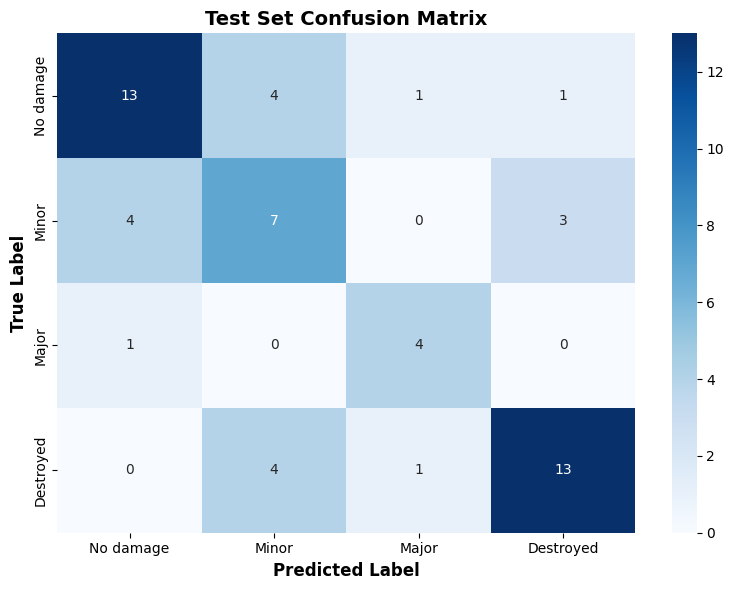

In [ ]:
from sklearn.metrics import confusion_matrix

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Calculate per-class accuracy
print("\n--- Per-Class Recall (from confusion matrix) ---")
for i in range(4):
    class_name = ['No damage', 'Minor', 'Major', 'Destroyed'][i]
    if cm[i].sum() > 0:
        class_recall = cm[i, i] / cm[i].sum()
        print(f"Class {i} ({class_name:12s}): {class_recall:.3f} ({cm[i,i]}/{cm[i].sum()} correct)")
    else:
        print(f"Class {i} ({class_name:12s}): No samples in test set")

# Plot matrix

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No damage', 'Minor', 'Major', 'Destroyed'],
            yticklabels=['No damage', 'Minor', 'Major', 'Destroyed'])
plt.ylabel('True Label', fontsize=12, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12, fontweight='bold')
plt.title('Test Set Confusion Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Creating the test images CSV

## Extract and load test data

In [ ]:
# Load the test data
test_data_path = '/content/_shared/bcourses-1547854-readonly/satellite-image-data/test_images_hurricane-matthew.npz'
test_data = np.load(test_data_path, allow_pickle=True)

print("Test data loaded!")
print(f"Number of images: {len(test_data.files)}")

# Extract all images from individual keys
test_images = []
for key in sorted(test_data.files, key=lambda x: int(x.split('_')[1])):  # Sort by number
    test_images.append(test_data[key])

test_images = np.array(test_images)
print(f"Number of test images: {len(test_images)}")
print(f"Test image shape: {test_images[0].shape}")

Test data loaded!
Number of images: 66
Number of test images: 66
Test image shape: (1024, 1024, 3)


## Processing test images

In [ ]:
# Process test images the same way as training data
test_resnet_data = []

print("\nProcessing test images with padding removal...")

for img_num in range(len(test_images)):
    img = test_images[img_num]

    # Apply same preprocessing: remove padding
    cropped_img, padding_info = detect_and_crop_padding(img)

    # Extract ResNet features from cropped image
    features = extract_resnet_features(cropped_img)

    test_resnet_data.append({
        'features': features,
        'image': cropped_img,
        'padding_info': padding_info
    })

    if (img_num + 1) % 50 == 0:
        print(f"  Processed {img_num + 1}/{len(test_images)} images...")

print(f"✓ Test samples processed: {len(test_resnet_data)}")

# Extract feature array
X_test_submission = np.array([item['features'] for item in test_resnet_data])
print(f"Test feature shape: {X_test_submission.shape}")


Processing test images with padding removal...
  Processed 50/66 images...
✓ Test samples processed: 66
Test feature shape: (66, 2048)


## Generating predictions

In [ ]:
# Use your trained model to make predictions
# (final_model should be your best model from GridSearchCV)
test_predictions = final_model.predict(X_test_submission)

print(f"\nPredictions generated!")
print(f"Number of predictions: {len(test_predictions)}")
print(f"Prediction distribution: {dict(zip(*np.unique(test_predictions, return_counts=True)))}")


Predictions generated!
Number of predictions: 66
Prediction distribution: {np.int64(0): np.int64(5), np.int64(1): np.int64(23), np.int64(2): np.int64(2), np.int64(3): np.int64(36)}


## Creating CSV file for submission

In [ ]:
import pandas as pd

# Create DataFrame with single column named 'pred'
submission_df = pd.DataFrame({
    'pred': test_predictions
})

# Save to CSV
output_filename = 'test_images_hurricane-matthew_predictions.csv'
submission_df.to_csv(output_filename, index=False)

print(f"\n✓ Submission file created: {output_filename}")
print(f"✓ Shape: {submission_df.shape}")
print(f"\nFirst few predictions:")
print(submission_df.head(10))

# Verify the format
print(f"\nFile format verification:")
print(f"  Column name: {submission_df.columns[0]}")
print(f"  Number of rows: {len(submission_df)}")
print(f"  Data type: {submission_df['pred'].dtype}")


✓ Submission file created: test_images_hurricane-matthew_predictions.csv
✓ Shape: (66, 1)

First few predictions:
   pred
0     1
1     1
2     1
3     1
4     1
5     1
6     0
7     1
8     1
9     1

File format verification:
  Column name: pred
  Number of rows: 66
  Data type: int64
